# P2 : Analysez des données de systèmes éducatifs

## Contexte et Mission :
Vous êtes Data Scientist dans une start-up de la EdTech, nommée academy, qui propose des contenus de formation en ligne pour un public de niveau lycée et université. 

Mark, votre manager, vous a convié à une réunion pour vous présenter le projet d’expansion à l’international de l’entreprise. Il vous confie une première mission d’analyse exploratoire, pour déterminer si les données sur l’éducation de la banque mondiale permettent d’informer le projet d’expansion.

Mark aimerait explorer les pays avec un fort potentiel de clients pour les services de academy, et comment ce potentiel pourrait évoluer. 

## Etape 1 : Menez une analyse générale des données
- Valider la qualité du jeu de données : vérifier s’il y a des données qui manquent ou qui sont dupliquées ;- Faire  une description précise de chaque fichier de données : nombre de lignes, nombre de colonnes, type des différentes colonnes, etc.

In [1]:
# Importer les librairies nécessaires à l'analyse 
import sys
import pandas as pd
import numpy as np
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px 
import missingno as msno
import datetime
now  = datetime.datetime.now().isoformat()
print('Modifié le           : ' + now)

Modifié le           : 2024-05-09T13:30:40.312117


In [2]:
print("Les versions utilisées sont :")
print('Python: {}'.format(sys.version))
print('matplotlib: {}'.format(matplotlib.__version__))
print('missingno: {}'.format(msno.__version__))
print('numpy: {}'.format(np.__version__))
print('panda: {}'.format(pd.__version__))
print('plotly: {}'.format(plotly.__version__))
print('seaborn: {}'.format(sns.__version__))

Les versions utilisées sont :
Python: 3.11.7 | packaged by Anaconda, Inc. | (main, Dec 15 2023, 18:05:47) [MSC v.1916 64 bit (AMD64)]
matplotlib: 3.8.0
missingno: 0.5.2
numpy: 1.26.4
panda: 2.1.4
plotly: 5.9.0
seaborn: 0.12.2


## Etape 1 : Menez une analyse générale du jeu de données "EdStatsCountry.csv" 

In [2]:
# Charger mon fichier CSV "EdStatsCountry.csv" dans un DataFrame
data = pd.read_csv('EdStatsCountry.csv')

In [3]:
# afficher les 5 premieres lignes du DataFrame
data.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


In [46]:
# Vérifier les données manquantes

# Calculer le nombre de valeurs manquantes pour chaque colonne
nb_valeurs_manquantes = data.isnull().sum()

# Calculer le pourcentage de valeurs manquantes pour chaque colonne
pourcentage_valeurs_manquantes = (nb_valeurs_manquantes / len(data)) * 100

# Créer un DataFrame pour afficher les résultats
resultats_manquants = pd.DataFrame({'Nombre de valeurs manquantes': nb_valeurs_manquantes, 'Pourcentage de valeurs manquantes': pourcentage_valeurs_manquantes})

# Afficher les résultats
print(resultats_manquants)

                                                   Nombre de valeurs manquantes  \
Country Code                                                                  0   
Short Name                                                                    0   
Table Name                                                                    0   
Long Name                                                                     0   
2-alpha code                                                                  3   
Currency Unit                                                                26   
Special Notes                                                                96   
Region                                                                       27   
Income Group                                                                 27   
WB-2 code                                                                     1   
National accounts base year                                                  36   
Nati

In [47]:
# Calculer le nombre totale des valeurs manquantes et son pourcentage

# Supprimer la colonne inutile ou vide 'Unnamed: 31' 
data_sans_colonne_inutile = data.drop(columns=['Unnamed: 31'])

# Calculer le nombre total de valeurs manquantes dans le DataFrame sans la colonne inutile
total_missing_values = data_sans_colonne_inutile.isnull().sum().sum()

# Calculer le nombre total de valeurs dans le DataFrame sans la colonne inutile
total_values = data_sans_colonne_inutile.size

# Calculer le pourcentage total de valeurs manquantes
total_missing_percentage = (total_missing_values / total_values) * 100

# Afficher les résultats
print("Nombre total de valeurs manquantes :", total_missing_values)
print("Pourcentage total de valeurs manquantes :", total_missing_percentage)

Nombre total de valeurs manquantes : 2113
Pourcentage total de valeurs manquantes : 28.28269307990898


In [5]:
# Vérifier les données dupliquées
donnees_dupliquees = data.duplicated().sum()
print("\nDonnées dupliquées :", donnees_dupliquees)


Données dupliquées : 0


In [6]:
# Afficher des informations sur le type d'index et les colonnes, les valeurs non nulles et l'utilisation de la mémoire
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 32 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Country Code                                       241 non-null    object 
 1   Short Name                                         241 non-null    object 
 2   Table Name                                         241 non-null    object 
 3   Long Name                                          241 non-null    object 
 4   2-alpha code                                       238 non-null    object 
 5   Currency Unit                                      215 non-null    object 
 6   Special Notes                                      145 non-null    object 
 7   Region                                             214 non-null    object 
 8   Income Group                                       214 non-null    object 
 9   WB-2 code 

In [8]:
# Définir et obtenir le nombre de lignes et de colonnes
nb_lignes, nb_colonnes = data.shape

# Obtenir le type des différentes colonnes
types_colonnes = data.dtypes

# Afficher les informations
print("Nombre de lignes :", nb_lignes)
print("Nombre de colonnes :", nb_colonnes)
print("\nTypes des différentes colonnes :\n", types_colonnes)

Nombre de lignes : 241
Nombre de colonnes : 32

Types des différentes colonnes :
 Country Code                                          object
Short Name                                            object
Table Name                                            object
Long Name                                             object
2-alpha code                                          object
Currency Unit                                         object
Special Notes                                         object
Region                                                object
Income Group                                          object
WB-2 code                                             object
National accounts base year                           object
National accounts reference year                     float64
SNA price valuation                                   object
Lending category                                      object
Other groups                                          object
Sys

<Axes: >

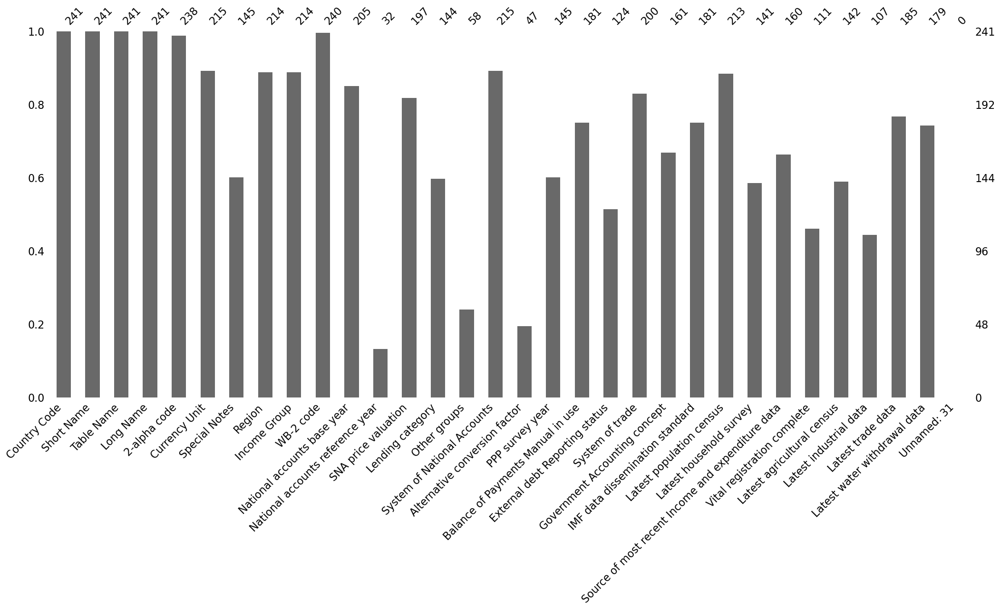

In [9]:
# Vérification du remplissage de chaque colonne
msno.bar(data)

### Conclusions concernant le jeu de données EdStatsCountry.csv :

- Le dataset contient des informations géographiques sur les pays (code 2-alpha, code WB-2, les noms des pays, les regroupements par régions et par groupe de revenus (241 au total), des données économiques globales et des dates de référence des dernières études.
- Le jeu de données contient 241 lignes et 32 colonnes.
- Nombre de valeurs manquantes totales est de 2113 avec un pourcentage de 28.28 %.
- Pas de Données dupliquées.
  
  En cas d'utilisantion de ce jeu de données dans notre analyse :
- Certaines colonnes sont en float et contiennent des dates (années) : à transformer.
- 
La colonne Unnamed:31 est vide et devra être supprimée.


## Etape 1 : Menez une analyse générale du jeu de données "EdStatsCountry-Series.csv"

In [10]:
# Charger mon fichier CSV "EdStatsCountry-Series.csv" dans un DataFrame
data2 = pd.read_csv('EdStatsCountry-Series.csv')

In [11]:
# Afficher les 10 premières lignes du DataFrame
data2.head(10)

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
5,AFG,NY.GDP.MKTP.PP.KD,Estimates are based on regression.,NaN
6,AFG,NY.GNP.MKTP.PP.CD,Estimates are based on regression.,NaN
7,AFG,NY.GDP.MKTP.PP.CD,Estimates are based on regression.,NaN
8,AFG,NY.GDP.PCAP.PP.KD,Estimates are based on regression.,NaN
9,AFG,NY.GNP.PCAP.PP.CD,Estimates are based on regression.,NaN


In [12]:
# Vérifier les données manquantes
donnees_manquantes = data2.isnull().sum()
print("Données manquantes :\n", donnees_manquantes)

Données manquantes :
 CountryCode      0
SeriesCode       0
DESCRIPTION      0
Unnamed: 3     613
dtype: int64


In [13]:
# Vérifier les données dupliquées
donnees_dupliquees = data2.duplicated().sum()
print("Données dupliquées :\n", donnees_dupliquees)

Données dupliquées :
 0


In [14]:
# Afficher des informations sur le type d'index et les colonnes, les valeurs non nulles et l'utilisation de la mémoire
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 613 entries, 0 to 612
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CountryCode  613 non-null    object 
 1   SeriesCode   613 non-null    object 
 2   DESCRIPTION  613 non-null    object 
 3   Unnamed: 3   0 non-null      float64
dtypes: float64(1), object(3)
memory usage: 19.3+ KB


<Axes: >

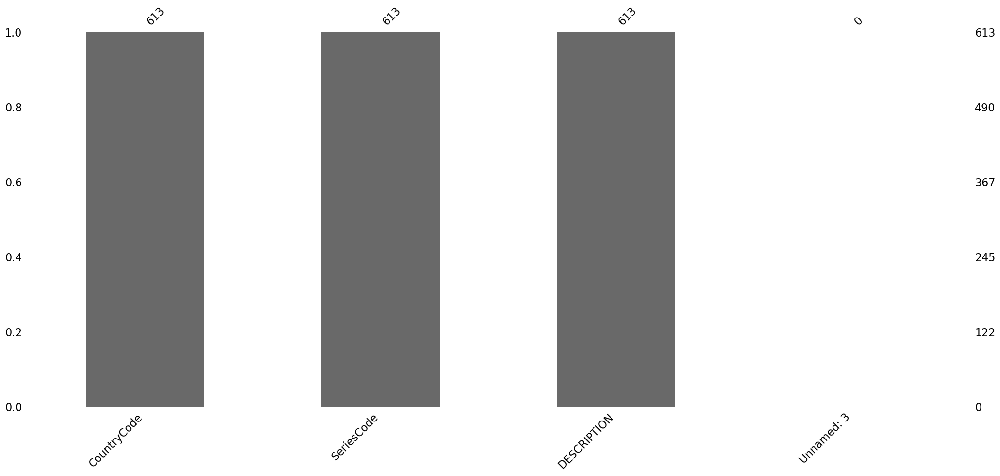

In [15]:
# Vérification du remplissage de chaque colonne
msno.bar(data2)

### Conclusions concernant le jeu de données "EdStatsCountry-Series.csv"

- Le jeu de données contient les références des sources de certains indicateurs par pays présents dans le jeu de données EdStatsCountry.csv- 
Le jeu de données contient 613 lignes et 4 colonnes
- Pas de e valeurs manquant, sauf dans la colonne 'Unnamed: 3' qui est  vide, à supprimer en cas d'utilisation de ce jeu de données.
- Pas de valeurs dupliquéess


## Etape 1 : Menez une analyse générale du jeu de données "EdStatsFootNote.csv"

In [16]:
# Charger mon fichier CSV "EdStatsFootNote.csv" dans un DataFrame
data3 = pd.read_csv('EdStatsFootNote.csv')

In [17]:
# Afficher les 10 premières lignes de DataFrame
data3.head(10)

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN
5,ABW,SE.PRE.NENR,YR2000,Country estimation.,NaN
6,ABW,SE.SEC.ENRL.VO.FE,YR2005,Country estimation.,NaN
7,ABW,SE.SEC.ENRL.GC,YR2003,Country estimation.,NaN
8,ABW,SE.PRM.TCHR.FE,YR1999,Country estimation.,NaN
9,ABW,SE.PRE.TCHR.FE.ZS,YR2008,Country estimation.,NaN


In [20]:
# Vérifier les données manquantes
donnees_manquantes = data3.isnull().sum()
print("Données manquantes :\n", donnees_manquantes)

Données manquantes :
 CountryCode         0
SeriesCode          0
Year                0
DESCRIPTION         0
Unnamed: 4     643638
dtype: int64


In [21]:
# Vérifier les données dupliquées
donnees_dupliquees = data3.duplicated().sum()
print("Données dupliquées :\n", donnees_dupliquees)

Données dupliquées :
 0


In [22]:
# Afficher des informations sur le type d'index et les colonnes, les valeurs non nulles et l'utilisation de la mémoire
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643638 entries, 0 to 643637
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   CountryCode  643638 non-null  object 
 1   SeriesCode   643638 non-null  object 
 2   Year         643638 non-null  object 
 3   DESCRIPTION  643638 non-null  object 
 4   Unnamed: 4   0 non-null       float64
dtypes: float64(1), object(4)
memory usage: 24.6+ MB


<Axes: >

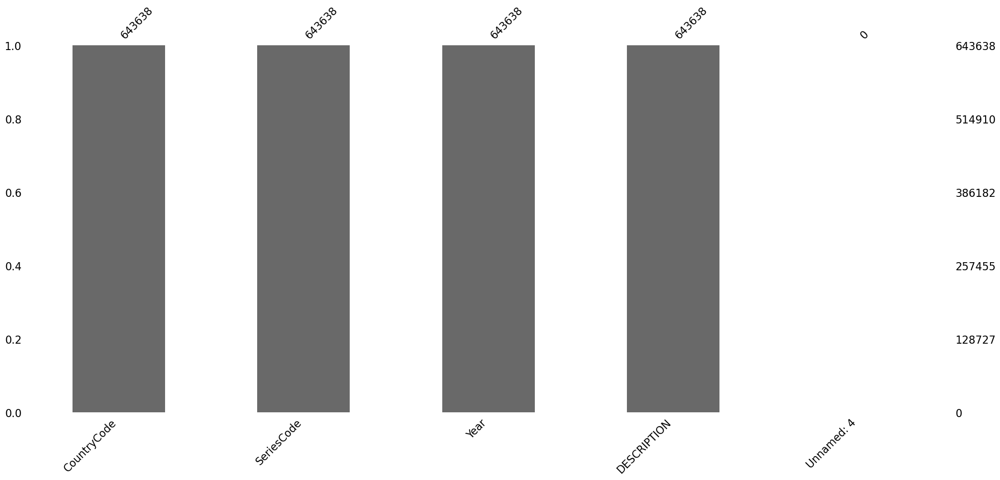

In [23]:
# Vérification du remplissage de chaque colonne
msno.bar(data3)

### Conclusions concernant le jeu de données "EdStatsFootNote.csv"

- Le jeu de données contient les années de références de mises à jour des indicateurs par code pays et la description des incertitudes, exceptions, remarques sur les mises à jour.- 
Le jeu de données contient 643638 lignes et 5 colonnes
- Pas de valeurs manquantes, ni de valeurs dupliquées.
- La colonne Unnamed:4 est vide, à supprimer en cas d'utilisantion de ce jeu de données..

## Etape1 : Menez une analyse générale du jeu de données "EdStatsSeries.csv"

In [24]:
# Charger mon fichier CSV "EdStatsSeries" dans un DataFrame
data4 = pd.read_csv('EdStatsSeries.csv')

In [25]:
# Afficher les 5 premières lignes du DataFrame
data4.head()

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
# Vérifier les données manquantes
donnees_manquantes = data4.isnull().sum()
print("Données manquantes :\n", donnees_manquantes)

Données manquantes :
 Series Code                               0
Topic                                     0
Indicator Name                            0
Short definition                       1509
Long definition                           0
Unit of measure                        3665
Periodicity                            3566
Base Period                            3351
Other notes                            3113
Aggregation method                     3618
Limitations and exceptions             3651
Notes from original source             3665
General comments                       3651
Source                                    0
Statistical concept and methodology    3642
Development relevance                  3662
Related source links                   3450
Other web links                        3665
Related indicators                     3665
License Type                           3665
Unnamed: 20                            3665
dtype: int64


In [49]:
# Calculer le nombre totale des valeurs manquantes et son pourcentage

# Supprimer la colonne inutile ou vide 'Unnamed: 20' 
data4_sans_colonne_inutile = data4.drop(columns=['Unnamed: 20'])

# Calculer le nombre total de valeurs manquantes dans le DataFrame sans la colonne inutile
total_missing_values = data4_sans_colonne_inutile.isnull().sum().sum()

# Calculer le nombre total de valeurs dans le DataFrame sans la colonne inutile
total_values = data4_sans_colonne_inutile.size

# Calculer le pourcentage total de valeurs manquantes
total_missing_percentage = (total_missing_values / total_values) * 100

# Afficher les résultats
print("Nombre total de valeurs manquantes :", total_missing_values)
print("Pourcentage total de valeurs manquantes :", total_missing_percentage)

Nombre total de valeurs manquantes : 51538
Pourcentage total de valeurs manquantes : 70.31105047748977


In [27]:
# Vérifier les données dupliquées
donnees_dupliquees = data4.duplicated().sum()
print("\nDonnées dupliquées :", donnees_dupliquees)


Données dupliquées : 0


In [28]:
# Afficher des informations sur le type d'index et les colonnes, les valeurs non nulles et l'utilisation de la mémoire
data4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3665 entries, 0 to 3664
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Series Code                          3665 non-null   object 
 1   Topic                                3665 non-null   object 
 2   Indicator Name                       3665 non-null   object 
 3   Short definition                     2156 non-null   object 
 4   Long definition                      3665 non-null   object 
 5   Unit of measure                      0 non-null      float64
 6   Periodicity                          99 non-null     object 
 7   Base Period                          314 non-null    object 
 8   Other notes                          552 non-null    object 
 9   Aggregation method                   47 non-null     object 
 10  Limitations and exceptions           14 non-null     object 
 11  Notes from original source    

<Axes: >

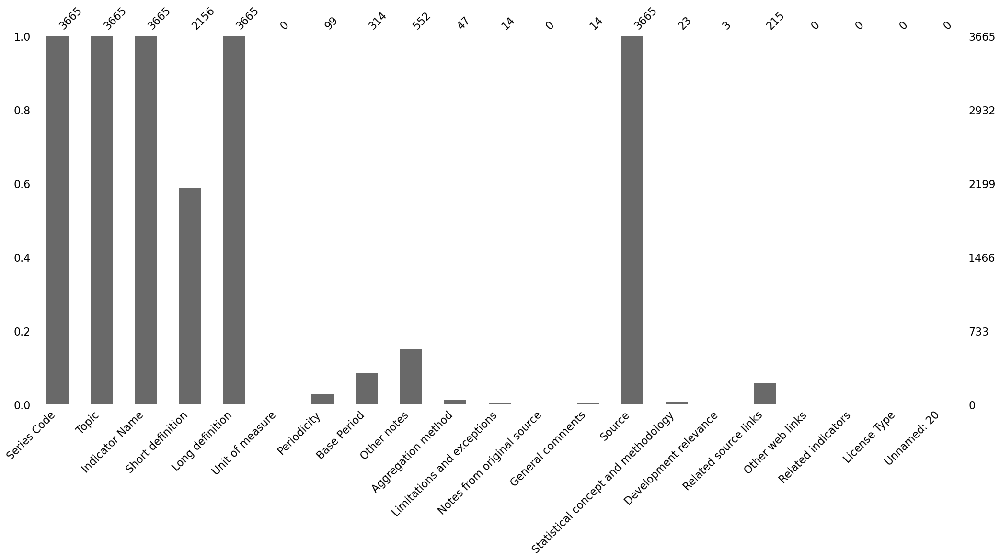

In [29]:
# Vérification du remplissage de chaque colonne
msno.bar(data4)

### Conclusions concernant le jeu de données "EdStatsSeries.csv"

- Le jeu de données permet de connaître le sujet des indicateurs, leurs descriptions longues et leurs sources. 
- Il donne des informations sur les indicateurs socio-éduco-économique (3665 indicateurs au total).
- Le jeu de données contient 3665 lignes et 21 colonnes.
- Le nombre de valeurs manquantes totales est de 51538 avec un pourcentage de 70.31%.
- Pas de valeurs dupliquées.

En cas d'utilisation de ce jeu de données:
- Les 5 colonnes principales sont "Series Code", "Topic", "Indicator Name", "Long definition", et "Source" qui sont totalement complètes.
- Le reste des variables est très peu renseigné et 6 variables sont complètement vides (à supprimer).



## Etape 1 : Menez une analyse générale du jeu de données "EdStatsData.csv"

In [3]:
# Charger mon fichier CSV "EdStatsData.csv" dans un DataFrame
data1 = pd.read_csv('EdStatsData.csv')

In [4]:
# Afficher les 15 premières lignes du DataFrame
data1.head(15)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.365540,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Arab World,ARB,"Adjusted net enrolment rate, primary, female (%)",SE.PRM.TENR.FE,43.351101,43.318150,44.640701,45.845718,46.449501,48.363892,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Arab World,ARB,"Adjusted net enrolment rate, primary, gender p...",UIS.NERA.1.GPI,0.658570,0.656400,0.663290,0.672040,0.672610,0.691760,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Arab World,ARB,"Adjusted net enrolment rate, primary, male (%)",SE.PRM.TENR.MA,65.826233,65.993584,67.301857,68.219078,69.059013,69.914551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Vérifier les données manquantes

# Calculer le nombre de valeurs manquantes pour chaque colonne
nb_valeurs_manquantes = data1.isnull().sum()

# Calculer le pourcentage de valeurs manquantes pour chaque colonne
pourcentage_valeurs_manquantes = (nb_valeurs_manquantes / len(data1)) * 100

# Créer un DataFrame pour afficher les résultats
resultats_manquants = pd.DataFrame({'Nombre de valeurs manquantes': nb_valeurs_manquantes, 'Pourcentage de valeurs manquantes': pourcentage_valeurs_manquantes})

# Afficher les résultats
print(resultats_manquants)

                Nombre de valeurs manquantes  \
Country Name                               0   
Country Code                               0   
Indicator Name                             0   
Indicator Code                             0   
1970                                  814642   
...                                      ...   
2085                                  835494   
2090                                  835494   
2095                                  835494   
2100                                  835494   
Unnamed: 69                           886930   

                Pourcentage de valeurs manquantes  
Country Name                             0.000000  
Country Code                             0.000000  
Indicator Name                           0.000000  
Indicator Code                           0.000000  
1970                                    91.849639  
...                                           ...  
2085                                    94.200670  
2090   

In [6]:
# Calculer le nombre totale des valeurs manquantes et son pourcentage

# Supprimer la colonne inutile ou vide 'Unnamed: 31' 
data1_sans_colonne_inutile = data1.drop(columns=['Unnamed: 69'])

# Calculer le nombre total de valeurs manquantes dans le DataFrame sans la colonne inutile
total_missing_values = data1_sans_colonne_inutile.isnull().sum().sum()

# Calculer le nombre total de valeurs dans le DataFrame sans la colonne inutile
total_values = data1_sans_colonne_inutile.size

# Calculer le pourcentage total de valeurs manquantes
total_missing_percentage = (total_missing_values / total_values) * 100

# Afficher les résultats
print("Nombre total de valeurs manquantes :", total_missing_values)
print("Pourcentage total de valeurs manquantes :", total_missing_percentage)

Nombre total de valeurs manquantes : 52568249
Pourcentage total de valeurs manquantes : 85.89840022994152


In [7]:
# Vérifier les données dupliquées
donnees_dupliquees = data1.duplicated().sum()
print("donnees dupliquees :\n", donnees_dupliquees)

donnees dupliquees :
 0


In [8]:
# Afficher des informations sur le type d'index et les colonnes, les valeurs non nulles et l'utilisation de la mémoire
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 70 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16  1982            37511 non-null   float64
 17  1983      

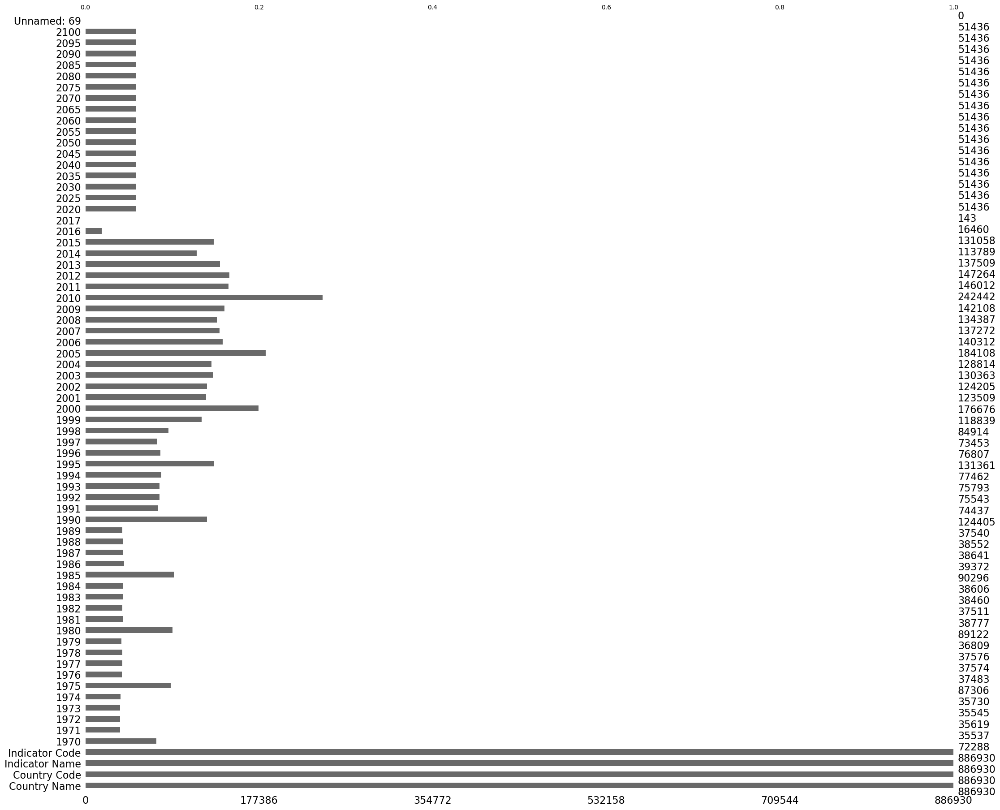

In [8]:
# Vérification du remplissage de chaque colonne
msno.bar(data1)

# Enregistrer le graphe
plt.savefig("graphique.png")

### Conclusions concernant le jeu de données "EdStatsData.csv"
- Ce jeu de données donne une idée sur l'évolution de plusieurs indicateurs entre la période de 1970 à 2017 pour tous les pays du monde et certaines macros régions du monde, avec des prédictions pour les années 2020 à 2100, il semble donc très intéressant pour notre problématique.
- Ce jeu de données contient 886930 lignes et 70 colonnes.
- Le nombre totale de valeurs manquantes est de 52568249 avec un pourcentage de  85.8%.
- Pas de valeurs dupliquées.
- On observe un pic de données tous les 5 ans.
- Les données sont presque doublées tous les 10 ans à partir de 1990.
- Les années 2020 à 2100 sont des années de prédictions non exploitables pour notre mission, sauf pour prédire l'évolution des pays potentiels au futur. 
- Les variables des code/nom des pays et des code/nom des indicateurs sont 100% complètes.
- Très peu de données à exploiter sur les périodes 1970-1998 et 2016-2017.
- L'année comportant le maximum de données est l'année 2010.
- Les années 2016 et 2017, les plus proches de l'année courante (2024), mais l'année 2016 contient très peu de données et pas de données pour l'année 2017. Ils sont donc inexploitables.
- L'année 2015 est l'année la plus proche de l'année en cours (2024) avec un nombre raisonnable de données à exploiter.
  
  A retenir :
- La période la plus récente avec plus de données à exploiter est entre 2010 et 2015.
- La variable 'Country Name' comporte des données autres que des noms de pays : des noms de région ou des noms de regroupement de revenu,
ou certains regroupement de pays (European Union, North America..) qui devront être nettoyées du jeu de données pour la pré-analyse. 

## Etape 2 : Sélectionnez les données pertinentes

### Recherche des indicateurs pertinents pour notre étude exploratoire :
Sur le site de la banque mondiale et dans le fichier EdStatsSeries.csv, en cherchant les mots clés suivants : education, GDP, upper secondary, tertiary, Internet, computers, Population ages 15-24, Adult literacy,  

### On obtient les indicateurs suivants : 

Indicateur économique : 
- SE.XPD.TOTL.GD.ZS (Government expenditure on education as % of GDP (%)) == Dépenses publiques en éducation en pourcentage du PIB (%) : Cet indicateur nous indique la part du produit intérieur brut (PIB) d'un pays consacrée à l'éducation. Les pays qui investissent davantage dans l'éducation pourraient être plus enclins à adopter des solutions de formation en ligne, ce qui peut influencer notre choix d'expansion.
  
Indicateurs éducatifs :
- SE.SEC.ENRR.UP (Gross enrolment ratio, upper secondary, both sexes (%) ) == Taux de scolarisation au niveau secondaire (Lycée), les deux sexes (%) : Cet indicateur peut nous aider à identifier les pays où il y a une forte demande pour l'éducation au niveau lycée, ce qui pourrait indiquer un fort potentiel de clients pour nos services.
- SE.TER.ENRR (Gross enrolment ratio, tertiary, both sexes (%) ) == Taux de scolarisation au niveau universitaire, les deux sexes (%) : De même, en examinant ce taux, nous pouvons cibler les pays où il y a une demande croissante pour l'enseignement supérieur en ligne.
  
Indicateurs numériques :
- IT.NET.USER.P2 (Internet users (per 100 people) ) == Utilisateurs Internet (pour 100 personnes) : Le nombre d'utilisateurs Internet pour 100 habitants peut indiquer la facilité d'accès à nos services de formation en ligne dans un pays donné.
- IT.CMP.PCMP.P2 (Personal computers (per 100 people)) == Ordinateurs personnels (pour 100 personnes) : Le nombre des personnes possédant un ordinateur personnel pour 100 habitants peut indiquer si cette population a les moyens techniques pour suivre nos formations en ligne.

Indicateurs démographiques :
- SP.POP.1524.TO.UN (Population, ages 15-24, total ) == Population âgée de 15 à 24 ans, total : Cet indicateur mesure la proportion de la population totale qui se situe dans la tranche d'âge de 15 à 24 ans. Une population plus jeune peut indiquer un potentiel de demande plus élevé pour l'éducation en ligne, notamment pour les niveaux lycée et université.
- SE.ADT.1524.LT.ZS (Youth literacy rate, population 15-24 years, both sexes (%)) == Taux d'alphabétisation des jeunes, population 15-24 ans, deux sexes (%) :  Cet indicateur mesure le pourcentage de personnes âgées de 15 à 24 ans qui sont capables de lire et d'écrire. Un taux élevé peut indiquer un fort niveau d'éducation dans la population jeune, ce qui pourrait favoriser l'adoption de nos services de formation en ligne.

In [9]:
# filtrer nos données en fonctions des indicateurs codes suivants
Indicators_Codes = ['SE.XPD.TOTL.GD.ZS', 'SE.SEC.ENRR.UP', 'SE.TER.ENRR', 'IT.NET.USER.P2', 'IT.CMP.PCMP.P2', 'SP.POP.1524.TO.UN', 'SE.ADT.1524.LT.ZS']
filt = data1['Indicator Code'].isin(Indicators_Codes)


In [10]:
# Stocker nos données filtrées dans une nouvelle data frame dataF
dataF = data1[filt]

In [11]:
# Afficher la nouvelle dataframe
dataF

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
1260,Arab World,ARB,Government expenditure on education as % of GD...,SE.XPD.TOTL.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1339,Arab World,ARB,"Gross enrolment ratio, tertiary, both sexes (%)",SE.TER.ENRR,5.89729,5.89062,6.1695,6.53124,6.93324,7.47784,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1343,Arab World,ARB,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1375,Arab World,ARB,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084,Arab World,ARB,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884608,Zimbabwe,ZWE,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
884640,Zimbabwe,ZWE,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
885349,Zimbabwe,ZWE,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
885747,Zimbabwe,ZWE,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Analyse de la qualité des données associées à ces indicateurs

In [19]:
# Vérifier les statistiques descriptives
dataF.describe()

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
count,99.000000,187.000000,174.000000,178.000000,172.000000,196.000000,192.000000,187.000000,189.000000,208.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,8.886478,6.994499,7.230870,7.193327,7.478479,9.194498,11.186010,8.823418,9.382422,10.368090,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,18.110207,8.756142,8.414247,8.476434,8.745196,13.580377,16.706314,11.335623,12.502973,14.015413,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.000000,0.000000,0.053430,0.068330,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,1.446105,1.550190,1.681530,1.717225,1.829240,1.881475,1.799255,1.930320,1.923680,2.187833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,3.745680,4.066390,4.468620,4.393095,4.381160,4.508230,5.018525,4.778410,4.800300,4.977995,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,6.318880,8.189925,8.517690,8.307495,8.629730,10.988628,12.891835,10.904445,11.973410,13.227165,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,99.755188,47.371769,48.165390,48.623749,48.980202,98.296227,99.819267,85.608978,99.796829,95.025124,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# Vérifier les valeurs manquantes
dataF.isnull().sum()

Country Name         0
Country Code         0
Indicator Name       0
Indicator Code       0
1970              1595
                  ... 
2080              1694
2085              1694
2090              1694
2095              1694
2100              1694
Length: 69, dtype: int64

# Etape 3 : Créer une dataframe dans le but de mener une analyse

 ### séparer les régions des pays 

In [12]:
# Définir la liste des régions
region = ['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World']


In [13]:
# Filtrer les régions
dataF_region = dataF[dataF['Country Name'].isin(region)]

In [14]:
# Filtrer les pays 
data_country = dataF[~dataF['Country Name'].isin(region)]

In [15]:
# Afficher mon dataframe contenant que la liste des pays
data_country

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
92885,Afghanistan,AFG,Government expenditure on education as % of GD...,SE.XPD.TOTL.GD.ZS,NaN,1.16036,1.11718,1.42788,NaN,1.30332,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92964,Afghanistan,AFG,"Gross enrolment ratio, tertiary, both sexes (%)",SE.TER.ENRR,0.76817,0.92394,0.95241,1.09745,1.0262,1.08012,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92968,Afghanistan,AFG,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93000,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
93709,Afghanistan,AFG,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884608,Zimbabwe,ZWE,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
884640,Zimbabwe,ZWE,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
885349,Zimbabwe,ZWE,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
885747,Zimbabwe,ZWE,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Choix des années pertinentes
- Plage temporelle retenue : 2010-2015 (période la plus récente avec plus de données fournies).
- Années pertinentes : 2010, 2011,  2012,  2013,   2014,   2015.

In [16]:
# Créer une dataframe contenant que les indicateurs pertinents et les années choisies
dataF1 = data_country.loc[filt,['Country Name', 'Country Code', 'Indicator Code', 'Indicator Name', '2010', '2011', '2012', '2013', '2014', '2015']]

In [17]:
# Afficher la nouvelle dataframe
dataF1

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",NaN,3.755980e+00,NaN,NaN,8.662800e+00,NaN
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00
93709,Afghanistan,AFG,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",NaN,NaN,3.623769e+01,3.696362e+01,NaN,NaN
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01
885349,Zimbabwe,ZWE,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06


In [28]:
# Afficher les statistiques descriptives
dataF1.describe()

,2010,2011,2012,2013,2014,2015
count,8.360000e+02,8.510000e+02,8.190000e+02,7.910000e+02,7.610000e+02,6.740000e+02
mean,1.447406e+06,1.424048e+06,1.479125e+06,1.528949e+06,1.585890e+06,1.787212e+06
std,1.172589e+07,1.161937e+07,1.180475e+07,1.194940e+07,1.210873e+07,1.277844e+07
min,0.000000e+00,0.000000e+00,0.000000e+00,9.000000e-01,9.900000e-01,1.083733e+00
25%,9.961720e+00,1.122861e+01,1.316398e+01,1.507912e+01,2.242400e+01,3.146116e+01
50%,5.642500e+01,5.996090e+01,6.131000e+01,6.300000e+01,6.935510e+01,7.634343e+01
75%,9.991067e+01,9.985160e+01,1.026051e+02,1.143554e+02,1.336186e+02,5.971525e+04
max,2.350568e+08,2.375485e+08,2.397136e+08,2.415350e+08,2.430027e+08,2.441202e+08


In [29]:
# Vérifier les valeurs manquantes sur ma nouvelle dataframe
dataF1.isnull().sum()

Country Name        0
Country Code        0
Indicator Code      0
Indicator Name      0
2010              683
2011              668
2012              700
2013              728
2014              758
2015              845
dtype: int64

### Gérer et traiter les valeurs manquantes

In [18]:

# Remplacer les valeurs manquantes par la moyenne des autres valeurs

# Sélectionner uniquement les colonnes avec les années
annees = ['2010', '2011', '2012', '2013', '2014', '2015']

# Calculer la moyenne des valeurs pour chaque ligne
dataF1['Mean'] = dataF1[annees].mean(axis=1)

# Remplacer les valeurs manquantes pour chaque année spécifiée par la moyenne respective
for annee in annees:
    dataF1[annee].fillna(dataF1['Mean'], inplace=True)

# Supprimez la colonne 'Mean' 
dataF1.drop(columns=['Mean'], inplace=True)

# Afficher notre DataFrame modifié
dataF1


,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",6.209390e+00,3.755980e+00,6.209390e+00,6.209390e+00,8.662800e+00,6.209390e+00
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00
93709,Afghanistan,AFG,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.660065e+01,3.660065e+01,3.623769e+01,3.696362e+01,3.660065e+01,3.660065e+01
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01
885349,Zimbabwe,ZWE,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06


In [19]:
# Supprimer les lignes contenant que des valeurs manquantes
dataF1_cleaned = dataF1.dropna()

In [20]:
# Afficher la dataframe nettoyé
dataF1_cleaned

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",6.209390e+00,3.755980e+00,6.209390e+00,6.209390e+00,8.662800e+00,6.209390e+00
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00
94107,Afghanistan,AFG,SP.POP.1524.TO.UN,"Population, ages 15-24, total",6.090239e+06,6.330684e+06,6.569239e+06,6.803785e+06,7.032072e+06,7.252785e+06
...,...,...,...,...,...,...,...,...,...,...
884604,Zimbabwe,ZWE,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",5.905600e+00,5.823760e+00,5.868670e+00,5.871750e+00,6.380610e+00,8.433270e+00
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.660065e+01,3.660065e+01,3.623769e+01,3.696362e+01,3.660065e+01,3.660065e+01
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06


In [21]:
# Créer un pivot table pour l'année la plus récente 2015
pivot_table = dataF1_cleaned.pivot_table(index='Country Name', 
                             columns= 'Indicator Code', 
                             values='2015')

In [22]:
# Afficher mon pivot table
pivot_table 

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
Country Name,,,,,,
Afghanistan,8.260000,46.990050,42.613129,6.209390,3.31754,7252785.0
Albania,63.252933,99.011295,89.460274,58.109951,3.53944,556269.0
Algeria,38.200000,NaN,61.089111,36.922279,NaN,6467818.0
Andorra,96.910000,100.000000,NaN,NaN,3.25368,NaN
Angola,12.400000,77.431130,20.749240,9.308020,3.47623,4259352.0
...,...,...,...,...,...,...
Virgin Islands (U.S.),54.839137,NaN,NaN,NaN,NaN,NaN
West Bank and Gaza,57.424192,99.340610,66.222519,44.283218,1.32232,1053004.0
"Yemen, Rep.",24.085409,NaN,35.656956,10.274040,NaN,5995687.0


# Etape 4 : Analysez le jeu de données

### Analyse des indicateurs retenus: les différentes statistiques (moyenne, médiane, écart-type, etc.)

In [23]:
# Calcul des statistiques pour chaque indicateur
statistiques = pivot_table.describe()

# Affichage des statistiques
print("Statistiques pour chaque indicateur :")
statistiques

Statistiques pour chaque indicateur :


Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
count,204.000000,121.000000,177.000000,165.000000,157.000000,1.810000e+02
mean,48.630114,89.158543,76.735901,39.361462,4.685562,6.654995e+06
std,28.558842,17.022032,35.421684,27.986252,1.891469,2.404044e+07
min,0.000000,23.523780,5.020860,0.745150,1.214010,1.445500e+04
25%,21.716942,85.716150,49.690262,13.602257,3.262120,4.897540e+05
50%,50.219659,98.287058,81.212189,36.228539,4.621675,1.331040e+06
75%,72.949675,99.300000,98.463112,62.300770,5.690636,4.945440e+06
max,98.323610,100.000000,194.101990,108.971404,12.837270,2.441202e+08


### Analyse des indicateurs retenus : représentations graphiques

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

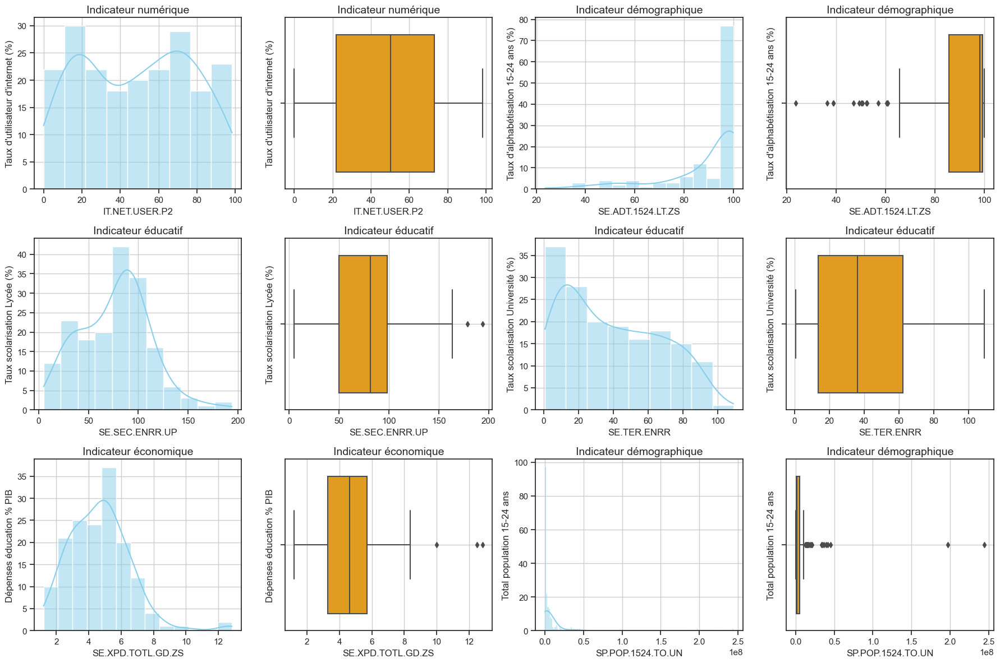

In [24]:
# Faire des histogrammes et boites à moustaches pour chaque indicateur (analyse univariée)
# Définir le style de visualisation
sns.set(style="ticks")

# Créer une seule figure avec des sous-graphiques
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))

# Liste des indicateurs avec leurs détails
indicateurs = [
    ('IT.NET.USER.P2', 'Taux d\'utilisateur d\'internet (%)', 'Indicateur numérique'),
    ('SE.ADT.1524.LT.ZS', 'Taux d\'alphabétisation 15-24 ans (%)', 'Indicateur démographique'),
    ('SE.SEC.ENRR.UP', 'Taux scolarisation Lycée (%)', 'Indicateur éducatif'),
    ('SE.TER.ENRR', 'Taux scolarisation Université (%)', 'Indicateur éducatif'),
    ('SE.XPD.TOTL.GD.ZS', 'Dépenses éducation % PIB', 'Indicateur économique'),
    ('SP.POP.1524.TO.UN', 'Total population 15-24 ans', 'Indicateur démographique')
]

# Création des histogrammes pour chaque indicateur
for i, (indicateur, ylabel, title) in enumerate(indicateurs):
    row = i // 2
    col = (i % 2) * 2
    
    # Histogramme
    sns.histplot(pivot_table[indicateur].dropna(), kde=True, ax=axes[row, col], color='skyblue')
    axes[row, col].set_title(title, fontsize=14)
    axes[row, col].set_xlabel(indicateur, fontsize=12)
    axes[row, col].set_ylabel(ylabel, fontsize=12)
    axes[row, col].grid(True)

# Création des boîtes à moustaches pour chaque indicateur
for i, (indicateur, ylabel, title) in enumerate(indicateurs):
    row = i // 2
    col = (i % 2) * 2 + 1
    
    # Boîte à moustaches
    sns.boxplot(x=pivot_table[indicateur].dropna(), ax=axes[row, col], color='orange')
    axes[row, col].set_title(title, fontsize=14)
    axes[row, col].set_ylabel(ylabel, fontsize=12)
    axes[row, col].grid(True)

# Supprimer les axes non utilisés
for ax in axes.flat[len(indicateurs)*2:]:
    ax.remove()

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Enregistrer l'image combinée
plt.savefig('histograms_and_boxplots_combined.png')

# Afficher l'image
plt.show()

*Conclusion :*
***

- Le taux de scolarisation dans l'enseignement supérieur est plus inégal entre les pays que le taux de scolarisation au niveau lycée.
- Pour l'indicateur numérique, forme bimodale, on distingue 2 groupes de pays répartis autour de 20% et 65%.
- Présence d'outliers pour les indicateurs démographique, économique et éducatif au niveau lycée. 

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

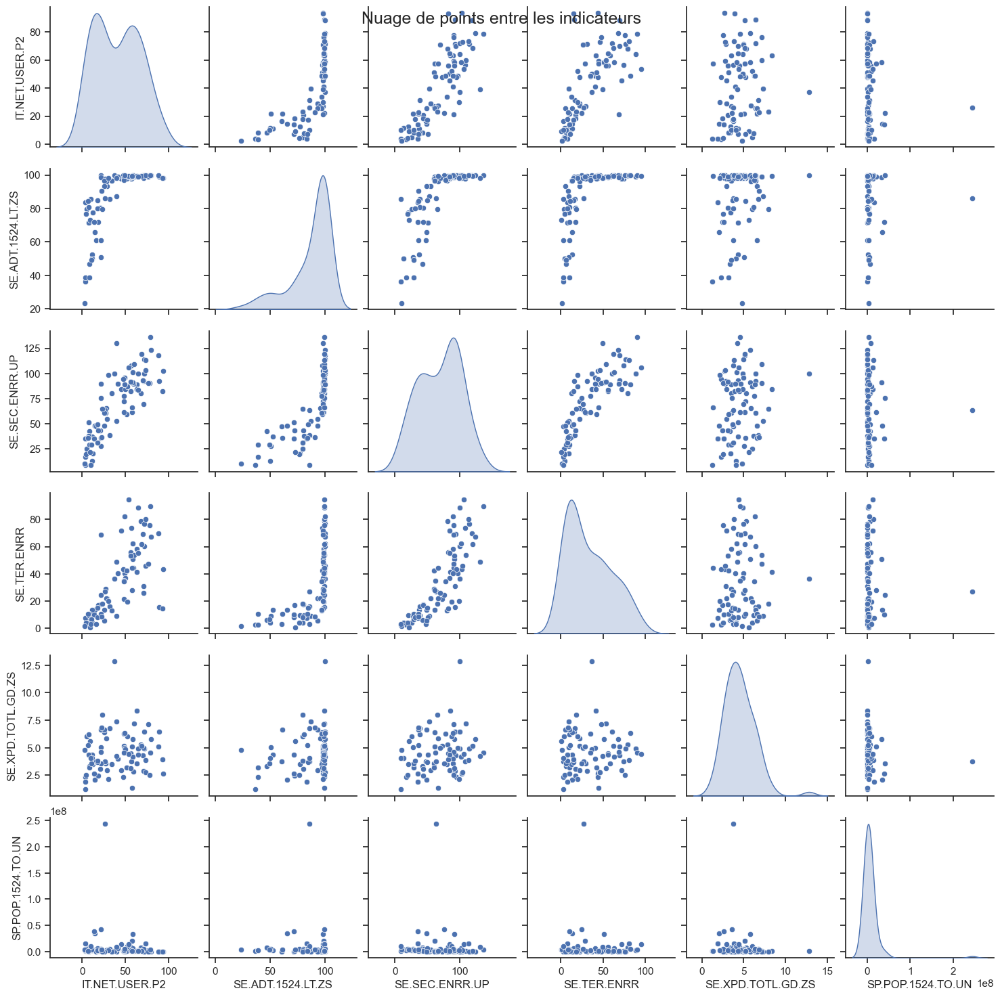

In [25]:
# Nuage de points entre chaque paire d'indicateurs ( analyse bivariée)
sns.pairplot(pivot_table.dropna(), kind="scatter", diag_kind="kde")
plt.suptitle('Nuage de points entre les indicateurs', fontsize=18)  # Modifier le titre principal
# Enregistrer l'image de nuage de points 
plt.savefig('nuage.png')
plt.show()

*Conclusion :*
***

Ce graphique de nuages de points nous donne une idée sur la corrélation entre 2 indicateurs, par exemple on remarque la présence d'un lien de corrélation positive entre  :

- les indicateurs SE.SEC.ENRR.UP (Taux de scolarisation au niveau secondaire (Lycée) (%) ) SE.TER.ENRR (Taux de scolarisation au niveau universitaire (%) )
- les indicateurs IT.NET.USER.P2 (Utilisateurs Internet (pour 100 personnes) )  et SE.SEC.ENRR.UP  (Taux de scolarisation au niveau secondaire (Lycée) (%))
- les indicateurs IT.NET.USER.P2 (Utilisateurs Internet (pour 100 personnes) )  et SE.TER.ENRR  (Taux de scolarisation au niveau universitaire (%))




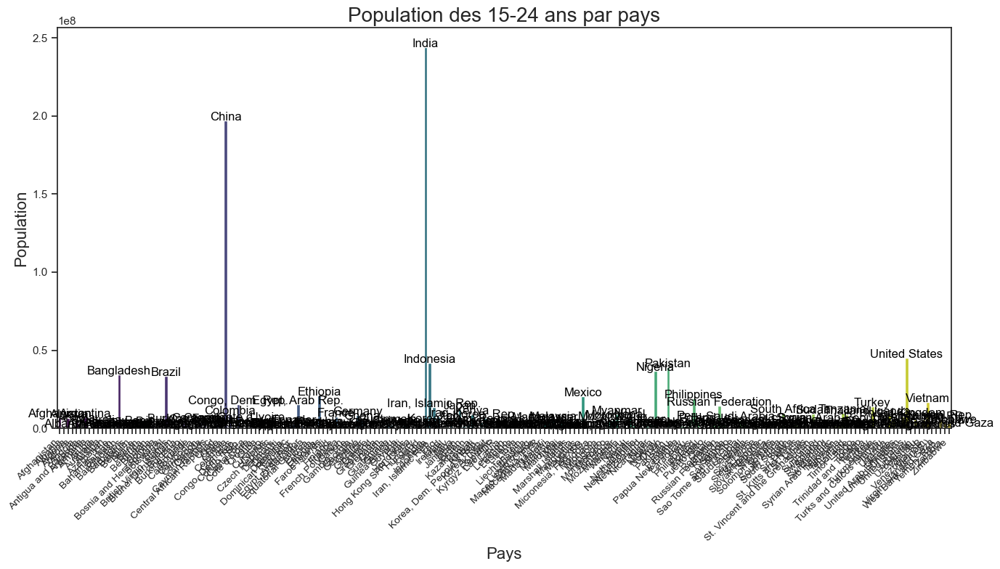

In [26]:
# pour avoir une idée sur les pays ayant plus de population jeune entre 15 et 24 ans
# Ajouter les noms de pays sur chaque barre pour avoir plus de visibilité
# Barplot pour la population des 15-24 ans par pays

plt.figure(figsize=(14, 8))  # Augmenter la taille de la figure
barplot = sns.barplot(x=pivot_table.index, y='SP.POP.1524.TO.UN', data=pivot_table, palette='viridis')  # Utiliser une palette de couleurs adaptée
plt.title('Population des 15-24 ans par pays', fontsize=20)
plt.xlabel('Pays', fontsize=16)
plt.ylabel('Population', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Incliner davantage et réduire la taille de la police des étiquettes d'axe

# Ajouter les noms des pays sur les barres
for index, value in enumerate(pivot_table['SP.POP.1524.TO.UN']):
    if pd.notnull(value):  # Vérifier si la valeur de population est définie
        if np.isfinite(index) and np.isfinite(value):  # Vérifier si les coordonnées sont finies
            barplot.text(index, value, pivot_table.index[index], color='black', ha="center")

plt.tight_layout()
plt.savefig('barplot.png')
plt.show()

** Conclusion*
***
Cette graphique à barre nous donne une idée sur les pays les plus peuplés en population jeune de 15 à 24 ans, donc là on distingue les pays suivantes en tête de liste: 
- l'Inde
- la Chine
- les Etats-Unis
- l'Indonésie
- le Pakistan
- la Bangladesh
- le Brazile
- le Niger
  etc
  

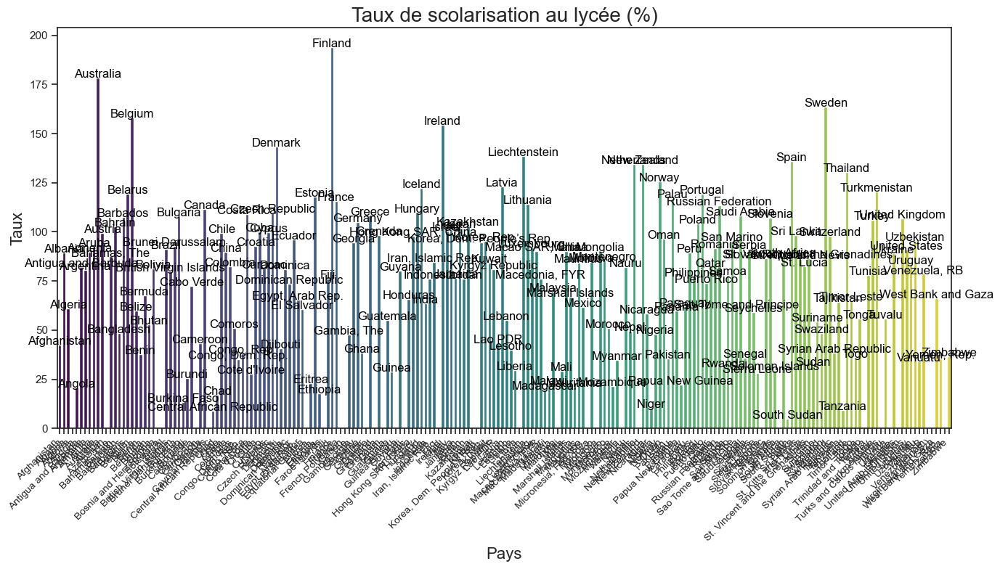

In [27]:
# Barplot pour le taux de scolarisation au lycée par pays

plt.figure(figsize=(14, 8))  # Augmenter la taille de la figure
barplot = sns.barplot(x=pivot_table.index, y='SE.SEC.ENRR.UP', data=pivot_table, palette='viridis')  # Utiliser une palette de couleurs adaptée
plt.title('Taux de scolarisation au lycée (%)', fontsize=20)
plt.xlabel('Pays', fontsize=16)
plt.ylabel('Taux', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Incliner davantage et réduire la taille de la police des étiquettes d'axe

# Ajouter les noms des pays sur les barres
for index, value in enumerate(pivot_table['SE.SEC.ENRR.UP']):
    if pd.notnull(value):  # Vérifier si la valeur de population est définie
        if np.isfinite(index) and np.isfinite(value):  # Vérifier si les coordonnées sont finies
            barplot.text(index, value, pivot_table.index[index], color='black', ha="center")

plt.tight_layout()
plt.savefig('barplot2.png')
plt.show()

** Conclusion*
***
Concernant la scolarisation au lycée, on voit apparaître de nouveaux pays avec un très fort taux de scolarisation, comme la Finland, l’Australie, La Suède, la Belgique, L’Ireland, le Danemark...etc

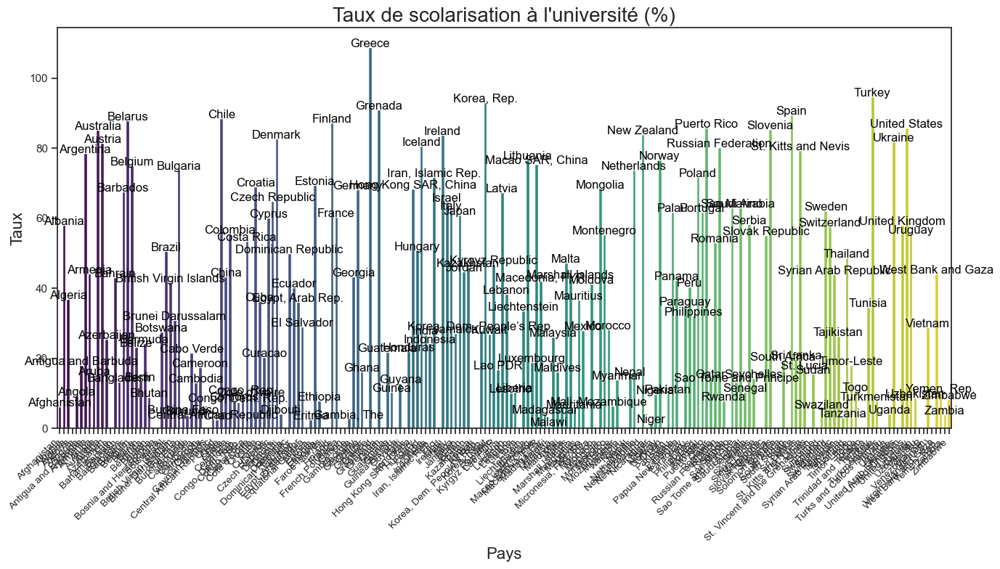

In [69]:
# Barplot pour le taux de scolarisation à l'université par pays

plt.figure(figsize=(14, 8))  # Augmenter la taille de la figure
barplot = sns.barplot(x=pivot_table.index, y='SE.TER.ENRR', data=pivot_table, palette='viridis')  # Utiliser une palette de couleurs adaptée
plt.title('Taux de scolarisation à l\'université (%)', fontsize=20)
plt.xlabel('Pays', fontsize=16)
plt.ylabel('Taux', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Incliner davantage et réduire la taille de la police des étiquettes d'axe

# Ajouter les noms des pays sur les barres
for index, value in enumerate(pivot_table['SE.TER.ENRR']):
    if pd.notnull(value):  # Vérifier si la valeur de population est définie
        if np.isfinite(index) and np.isfinite(value):  # Vérifier si les coordonnées sont finies
            barplot.text(index, value, pivot_table.index[index], color='black', ha="center")

plt.tight_layout()
plt.savefig('barplot1.png')
plt.show()

** Conclusion*
***
  Concernant le taux de scolarisation à l’université, on voit de nouveaux pays qui apparaissent avec un très fort taux de scolarisation ce qui indique un niveau élevé d’éducation pour ces pays, comme la Grèce, la Corée de Sud, la Grenade, le Finland, la Turkie, le Chile, la Biélorussie et l’Australie etc


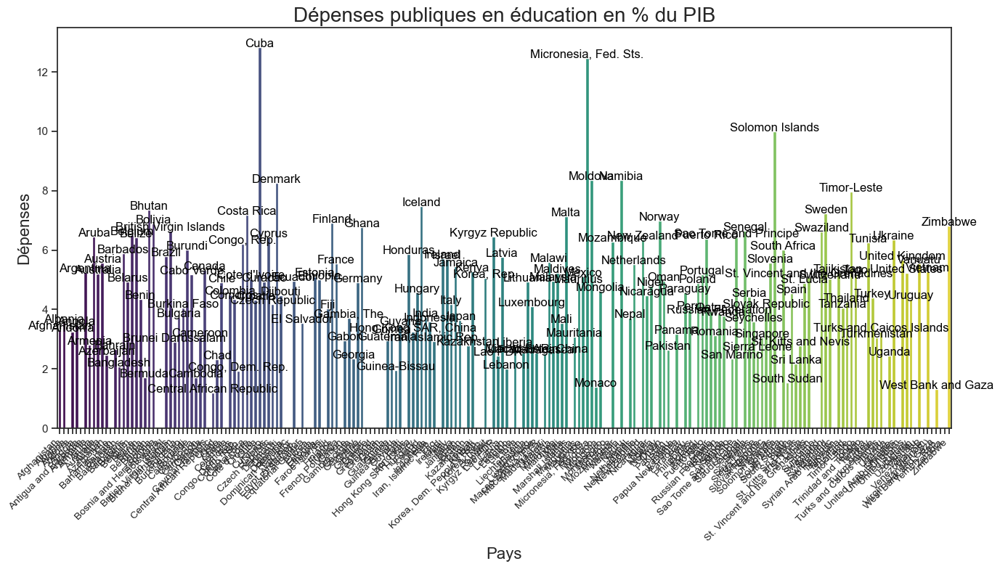

In [28]:
# Barplot pour Dépenses publiques en éducation en pourcentage du PIB (%)

plt.figure(figsize=(14, 8))  # Augmenter la taille de la figure
barplot = sns.barplot(x=pivot_table.index, y='SE.XPD.TOTL.GD.ZS', data=pivot_table, palette='viridis')  # Utiliser une palette de couleurs adaptée
plt.title('Dépenses publiques en éducation en % du PIB', fontsize=20)
plt.xlabel('Pays', fontsize=16)
plt.ylabel('Dépenses', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Incliner davantage et réduire la taille de la police des étiquettes d'axe

# Ajouter les noms des pays sur les barres
for index, value in enumerate(pivot_table['SE.XPD.TOTL.GD.ZS']):
    if pd.notnull(value):  # Vérifier si la valeur de population est définie
        if np.isfinite(index) and np.isfinite(value):  # Vérifier si les coordonnées sont finies
            barplot.text(index, value, pivot_table.index[index], color='black', ha="center")

plt.tight_layout()
plt.savefig('barplot3.png')
plt.show()

** Conclusion*
***
Concernant les dépenses publiques en éducation en % du PIB, là on voit d’autres pays en tête de liste, comme le Cuba, la Micronésie, Les îles Salomon, la Moldavie, le Namibie et le Danemark, etc 
  

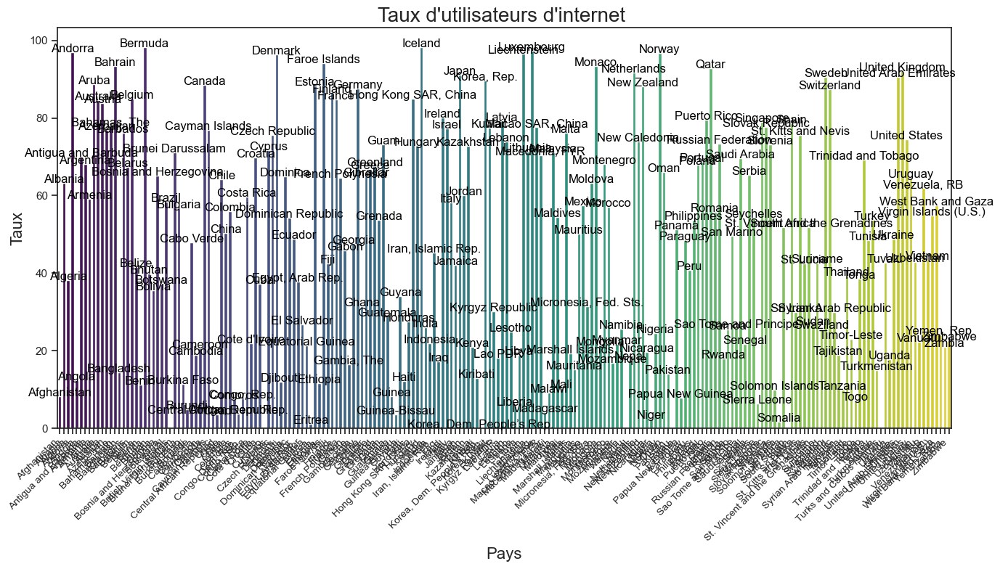

In [68]:
# Barplot pour Utilisateurs Internet (pour 100 personnes)

plt.figure(figsize=(14, 8))  # Augmenter la taille de la figure
barplot = sns.barplot(x=pivot_table.index, y='IT.NET.USER.P2', data=pivot_table, palette='viridis')  # Utiliser une palette de couleurs adaptée
plt.title('Taux d\'utilisateurs d\'internet ', fontsize=20)
plt.xlabel('Pays', fontsize=16)
plt.ylabel('Taux', fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Incliner davantage et réduire la taille de la police des étiquettes d'axe

# Ajouter les noms des pays sur les barres
for index, value in enumerate(pivot_table['IT.NET.USER.P2']):
    if pd.notnull(value):  # Vérifier si la valeur de population est définie
        if np.isfinite(index) and np.isfinite(value):  # Vérifier si les coordonnées sont finies
            barplot.text(index, value, pivot_table.index[index], color='black', ha="center")

plt.tight_layout()
plt.savefig('barplot4.png')
plt.show()

### Analysez les corrélations entre les différentes variables 

In [29]:
# Calculer la matrice de corrélation
corr_matrix = pivot_table.corr()
corr_matrix

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
Indicator Code,,,,,,
IT.NET.USER.P2,1.000000,0.703504,0.793854,0.736574,0.103787,-0.070287
SE.ADT.1524.LT.ZS,0.703504,1.000000,0.752351,0.584784,0.235403,0.015684
SE.SEC.ENRR.UP,0.793854,0.752351,1.000000,0.782352,0.254766,-0.040457
SE.TER.ENRR,0.736574,0.584784,0.782352,1.000000,0.220738,-0.037262
SE.XPD.TOTL.GD.ZS,0.103787,0.235403,0.254766,0.220738,1.000000,-0.097339
SP.POP.1524.TO.UN,-0.070287,0.015684,-0.040457,-0.037262,-0.097339,1.000000


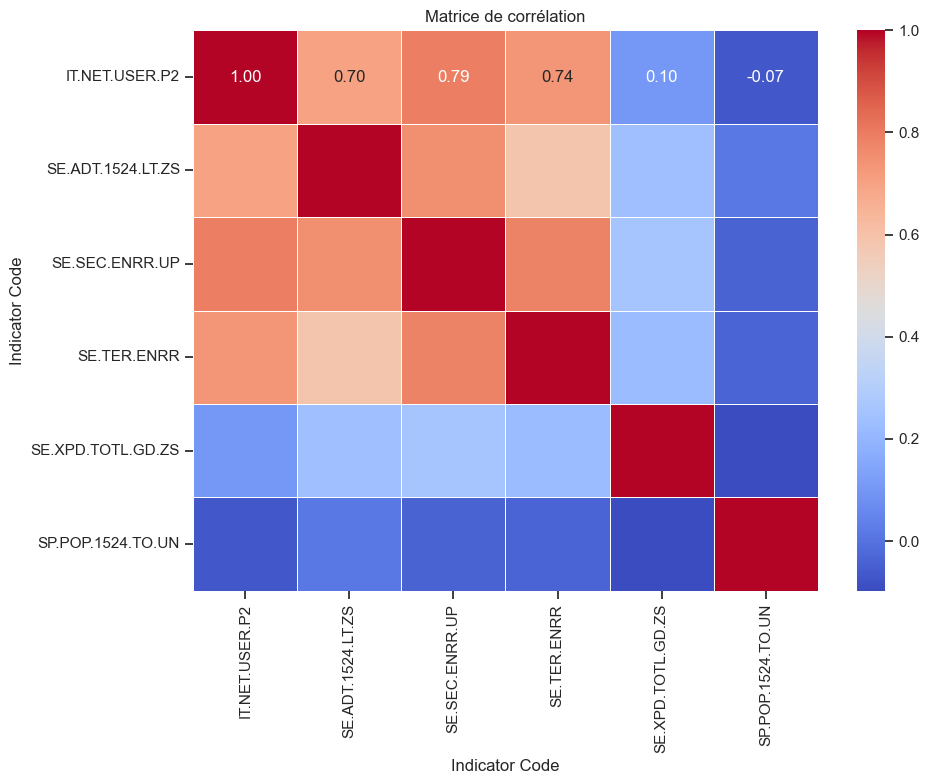

In [30]:
# Afficher la matrice de corrélation sous forme de heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matrice de corrélation')
# Ajuster la disposition pour éviter que les noms d'axes soient coupés
plt.tight_layout()
# Sauvegarder l'image avec une résolution plus élevée pour une meilleure qualité
plt.savefig('heatmap.png', dpi=300)
plt.show()

** Conclusion *
***
 On voit une forte corrélation entre les indicateurs :
- "IT.NET.USER.P2" et "SE.SEC.ENRR.UP" avec une valeur de 0.79, 
- "IT.NET.USER.P2" et "SE.TER.ENRR" avec une valeur de 0.73,
- "IT.NET.USER.P2" et "SE.ADT.1524.LT.ZS" avec une valeur de 0.70,
  
 Et pas de corrélation entre les indicateurs :
- "IT.NET.USER.P2" et "SP.POP.1524.TO.UN" avec une valeur de -0.07,
- "IT.NET.USER.P2" et "SE.XPD.TOTL.GD.ZS" avec une valeur de 0.10,

En conclusion plus la couleur représentant la matrice de corrélation sur le heatmap tend vers le rouge bordeaux plus il y'a de corrélation entre 2 indicateurs et plus la couleur tend vers le bleu plus on a absence de corrélation entre 2 indicateurs.


##  Quels sont les pays avec un fort potentiel de clients pour 'Academy'? 

#### Filtrer mes données par pays, en prenant la médiane comme valeur seuil, donc on garde que les pays ayant une valeur seuil supérieure ou égale à la médiane

In [31]:
# Réafficher mon pivot_table
pivot_table

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
Country Name,,,,,,
Afghanistan,8.260000,46.990050,42.613129,6.209390,3.31754,7252785.0
Albania,63.252933,99.011295,89.460274,58.109951,3.53944,556269.0
Algeria,38.200000,NaN,61.089111,36.922279,NaN,6467818.0
Andorra,96.910000,100.000000,NaN,NaN,3.25368,NaN
Angola,12.400000,77.431130,20.749240,9.308020,3.47623,4259352.0
...,...,...,...,...,...,...
Virgin Islands (U.S.),54.839137,NaN,NaN,NaN,NaN,NaN
West Bank and Gaza,57.424192,99.340610,66.222519,44.283218,1.32232,1053004.0
"Yemen, Rep.",24.085409,NaN,35.656956,10.274040,NaN,5995687.0


In [30]:
# Afficher la valeur médiane de chaque indicateur 

# Calculer la médiane de chaque indicateur
median_values = pivot_table.median()

# Créer un DataFrame à partir de la série median_values
median_df = pd.DataFrame(median_values, columns=['Median'])

# Afficher le DataFrame des médianes
median_df

,Median
Indicator Code,
IT.NET.USER.P2,5.021966e+01
SE.ADT.1524.LT.ZS,9.828706e+01
SE.SEC.ENRR.UP,8.121219e+01
SE.TER.ENRR,3.622854e+01
SE.XPD.TOTL.GD.ZS,4.621675e+00
SP.POP.1524.TO.UN,1.331040e+06


In [31]:
# Calculer la médiane de chaque indicateur
median_values = pivot_table.median()

# Créer une fonction pour filtrer les pays en fonction de la médiane de chaque indicateur
def filter_countries(row):
    for indicator_code in pivot_table.columns:
        if row[indicator_code] < median_values[indicator_code]:
            return False
    return True

# Appliquer la fonction de filtrage sur chaque ligne du dataframe
filtered_pivot_table = pivot_table[pivot_table.apply(filter_countries, axis=1)]

# Afficher le nouveau dataframe filtré
filtered_pivot_table

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
Country Name,,,,,,
Australia,84.560519,NaN,178.556668,85.332562,5.212932,2914620.0
Brazil,58.327952,98.440614,91.420326,50.604919,5.794417,33595574.0
Canada,88.470000,NaN,111.744696,NaN,5.321070,4373511.0
Cayman Islands,77.000000,NaN,NaN,NaN,NaN,NaN
Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0
China,50.300000,99.642290,89.651901,43.391769,NaN,197026759.0
Faroe Islands,94.200000,NaN,NaN,NaN,NaN,NaN
France,84.694500,NaN,115.591806,60.335406,5.552842,7567872.0
French Polynesia,64.560210,NaN,NaN,NaN,NaN,NaN


##### Après filtrage par la valeur médiane, on obtient un tableau de 24 pays potentiels ci-dessus.

In [32]:
filtered_pivot_table.isnull().sum()

Indicator Code
IT.NET.USER.P2        2
SE.ADT.1524.LT.ZS    17
SE.SEC.ENRR.UP        8
SE.TER.ENRR          10
SE.XPD.TOTL.GD.ZS    13
SP.POP.1524.TO.UN    11
dtype: int64

In [33]:
# Supprimer les pays avec plus de 2 valeurs manquantes (plus de 2 indicateurs manquantes)

# Calculer le nombre de valeurs manquantes par ligne
missing_values_per_row = filtered_pivot_table.isnull().sum(axis=1)


# Supprimer les lignes avec plus de 2 valeurs manquantes par rapport aux indicateurs
filtered_filtered_pivot_table = filtered_pivot_table.dropna(thresh=filtered_pivot_table.shape[1] - 2)

# Afficher le nouveau dataframe filtré
filtered_filtered_pivot_table

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN
Country Name,,,,,,
Australia,84.560519,NaN,178.556668,85.332562,5.212932,2914620.0
Brazil,58.327952,98.440614,91.420326,50.604919,5.794417,33595574.0
Canada,88.470000,NaN,111.744696,NaN,5.321070,4373511.0
Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0
China,50.300000,99.642290,89.651901,43.391769,NaN,197026759.0
France,84.694500,NaN,115.591806,60.335406,5.552842,7567872.0
Germany,87.589800,NaN,104.849243,68.265587,4.907592,8682394.0
"Korea, Rep.",89.648631,NaN,95.281891,93.179138,5.052110,6456561.0
Montenegro,68.119581,99.211820,85.574402,55.344589,NaN,NaN


##### Après filtrage par la médiane et suppression des pays ayant plus de 2 valeurs manquantes par rapport à nos 6 indicateurs, on obtient un tableau de 14 pays potentiels ci-dessus.

In [34]:

# Classer les pays en fonction de leurs scores
# Calculer un score pour chaque pays en fonction de ces indicateurs et de leurs poids

# Indicateurs pertinents pour l'analyse
indicateurs = ['IT.NET.USER.P2',	'SE.ADT.1524.LT.ZS',	'SE.SEC.ENRR.UP',	'SE.TER.ENRR',	'SE.XPD.TOTL.GD.ZS',	'SP.POP.1524.TO.UN']

# Remplacer les valeurs manquantes par 0
filtered_filtered_pivot_table.fillna(0, inplace=True)

# Normalisation des données
for indicateur in indicateurs:
    filtered_filtered_pivot_table[indicateur] = (filtered_filtered_pivot_table[indicateur] - filtered_filtered_pivot_table[indicateur].mean()) / filtered_filtered_pivot_table[indicateur].std()

# Attribution des poids aux indicateurs
poids = {'SE.XPD.TOTL.GD.ZS': 0.2, 'IT.NET.USER.P2': 0.1, 'SE.SEC.ENRR.UP': 0.3, 'SE.TER.ENRR': 0.3, 'SE.ADT.1524.LT.ZS': 0.05, 'SP.POP.1524.TO.UN': 0.05}

# Calcul du score pour chaque pays
filtered_filtered_pivot_table['Score'] = 0
for indicateur in indicateurs:
    filtered_filtered_pivot_table['Score'] += filtered_filtered_pivot_table[indicateur] * poids[indicateur]
    # Classement des pays par score
filtered_filtered_pivot_table= filtered_filtered_pivot_table.sort_values(by='Score', ascending=False)

# Affichage des pays les mieux classés
top_pays2 = filtered_filtered_pivot_table

# Affichage du résultat
top_pays2

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\3784928288.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_filtered_pivot_table.fillna(0, inplace=True)
C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\3784928288.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_filtered_pivot_table[indicateur] = (filtered_filtered_pivot_table[indicateur] - filtered_filtered_pivot_table[indicateur].mean()) / filtered_filtered_pivot_table[indicateur].std()
C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\3784928288.py:18: SettingWithCopyWarning: 
A valu

Indicator Code,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,Score
Country Name,,,,,,,
Australia,0.588216,-0.718234,2.939521,0.890764,0.468289,-0.397537,1.245777
Netherlands,1.115144,-0.718234,1.093245,0.405486,0.610177,-0.415145,0.626500
"Korea, Rep.",0.962478,-0.718234,-0.546971,1.220041,0.397360,-0.328903,0.325284
Chile,-0.902881,1.294430,-0.365398,1.026927,0.340522,-0.399427,0.221025
France,0.598071,-0.718234,0.303351,-0.158224,0.618205,-0.307369,0.175706
United States,-0.147811,-0.718234,-0.733733,0.910203,0.475848,0.420826,0.118459
Germany,0.811038,-0.718234,-0.146412,0.174560,0.333621,-0.285772,0.106072
United Kingdom,1.135458,-0.718234,-0.061711,-0.251000,0.676170,-0.304198,0.103845
Poland,-0.630135,-0.718234,-0.178104,0.318501,0.331604,-0.368671,-0.008919


In [35]:
top_pays2.loc[:,['Score']]

Indicator Code,Score
Country Name,
Australia,1.245777
Netherlands,0.626500
"Korea, Rep.",0.325284
Chile,0.221025
France,0.175706
United States,0.118459
Germany,0.106072
United Kingdom,0.103845
Poland,-0.008919


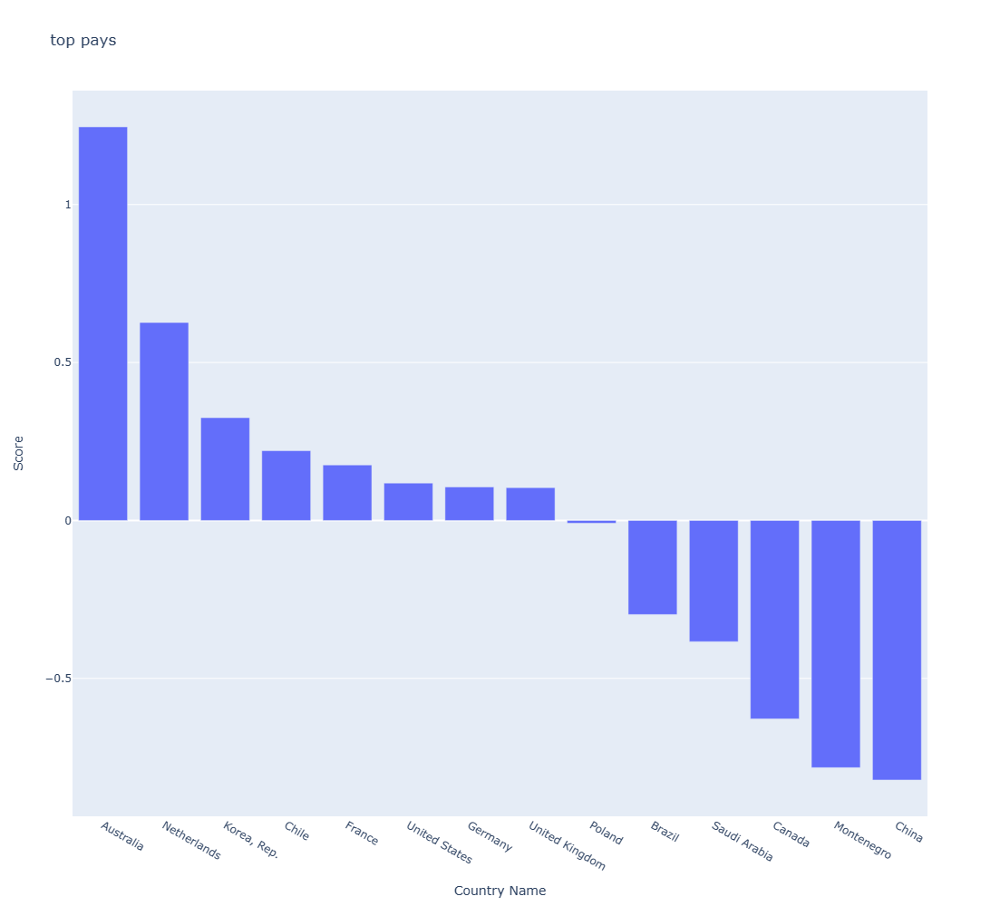

In [36]:
# Représenter graphiquement la liste des pays sortant en fonction du score 
data_score = top_pays2.reset_index()
fig1 = px.bar(data_score.sort_values(by='Score', ascending= False), x= 'Country Name', y = 'Score', width=1000, height = 1000, title = "top pays")
fig1.show()

 ##### En se basant sur le score calculé pour chaque pays, on obtient la liste de pays ci-dessus, avec en tête Australia, Netherlands, Korea, Rep., Chile, United States.	 

### 2 éme méthode de refiltration de notre filtred_pivot_table


Taux de pénétration =(nombre de clients obtenus / clients potentiels de la zone) X 100

In [37]:
# classification des pays en fonction du taux de pénétration d'indicateurs

# réinitialiser les index de mon filtered_pivot_table
df_pivot_table = filtered_pivot_table.reset_index()

# On rempli les valeurs manquantes par des 0 pour effectuer les calculs.
df = df_pivot_table.fillna(0)

#Les clients
df['customers'] = df['SE.SEC.ENRR.UP'] + df['SE.TER.ENRR'] ## la variable "customers" représente le taux des étudiants inscrits au Lycée et à l'université

# Avec le taux de pénétration on obtient le nombre de clients potentiels 
df['potential_customers'] = df['customers'] * df['IT.NET.USER.P2']/10000   ## la variable "potential_customers" représente le taux des étudiants lycéens et universitaires multiplié par le taux d'utilisation d'internet (%) et divisé par cent

df['potential_customers comp'] = df['customers'] * df['SE.XPD.TOTL.GD.ZS']/100  ## la variable "potential_customers comp" représente le taux des lycéens et universitaires multiplié par les dépenses publiques en éducation en pourcentage du PIB 

# Sortir la liste des pays en fonction du nombre de clients (customers)
df.sort_values(by='customers', ascending=False)[['Country Name', 'SE.SEC.ENRR.UP', 'SE.TER.ENRR', 'IT.NET.USER.P2', 'SE.XPD.TOTL.GD.ZS', 'SP.POP.1524.TO.UN', 'SE.ADT.1524.LT.ZS', 'customers']]



Indicator Code,Country Name,SE.SEC.ENRR.UP,SE.TER.ENRR,IT.NET.USER.P2,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,SE.ADT.1524.LT.ZS,customers
0,Australia,178.556668,85.332562,84.560519,5.212932,2914620.0,0.000000,263.889230
16,Netherlands,134.458405,73.768501,91.724138,5.534642,2005912.0,0.000000,208.226906
13,"Korea, Rep.",95.281891,93.179138,89.648631,5.052110,6456561.0,0.000000,188.461029
4,Chile,99.618759,88.577293,64.289000,4.923240,2817084.0,99.228235,188.196053
18,Palau,117.252457,61.863800,0.000000,0.000000,0.0,98.664440,179.116257
22,United States,90.821086,85.795776,74.554202,5.230070,45147517.0,0.000000,176.616862
7,France,115.591806,60.335406,84.694500,5.552842,7567872.0,0.000000,175.927212
19,Poland,104.092271,71.695662,67.997000,4.903020,4404280.0,0.000000,175.787933
9,Germany,104.849243,68.265587,87.589800,4.907592,8682394.0,0.000000,173.114830
20,Saudi Arabia,108.314159,63.066219,69.616236,0.000000,5298036.0,99.221770,171.380379


##### En utilisant la méthode du taux de pénétration d'indicateurs, on obtient une liste de 23 pays, classées en fonctions du nombre de clients "customers" ("taux d'étudiants au lycée et à l'université)

In [39]:
# Filtrer encore notre liste de pays

# Supprimer les pays avec plus de 2 valeurs nulles

# Compter le nombre de valeurs nulles par pays
null_values_count = (df == 0).sum(axis=1)

# Filtrer les pays qui ont plus de 2 valeurs nulles
filtered_countries = null_values_count[null_values_count <= 2].index

# Sélectionner les pays à conserver dans votre tableau
filtered_df = df.loc[filtered_countries]

# Réinitialiser les index du tableau filtré
filtered_df.reset_index(drop=True, inplace=True)

# Afficher le tableau filtré
filtered_df

Indicator Code,Country Name,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,customers,potential_customers,potential_customers comp
0,Australia,84.560519,0.000000,178.556668,85.332562,5.212932,2914620.0,263.889230,2.231461,13.756366
1,Brazil,58.327952,98.440614,91.420326,50.604919,5.794417,33595574.0,142.025246,0.828404,8.229536
2,Canada,88.470000,0.000000,111.744696,0.000000,5.321070,4373511.0,111.744696,0.988605,5.946013
3,Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0,188.196053,1.209894,9.265344
4,China,50.300000,99.642290,89.651901,43.391769,0.000000,197026759.0,133.043671,0.669210,0.000000
5,France,84.694500,0.000000,115.591806,60.335406,5.552842,7567872.0,175.927212,1.490007,9.768961
6,Germany,87.589800,0.000000,104.849243,68.265587,4.907592,8682394.0,173.114830,1.516309,8.495770
7,"Korea, Rep.",89.648631,0.000000,95.281891,93.179138,5.052110,6456561.0,188.461029,1.689527,9.521259
8,Netherlands,91.724138,0.000000,134.458405,73.768501,5.534642,2005912.0,208.226906,1.909943,11.524613
9,Poland,67.997000,0.000000,104.092271,71.695662,4.903020,4404280.0,175.787933,1.195305,8.618918


##### En supprimant les pays ayant plus de 2 valeurs nulles, on obtient une liste de 12 pays ci-dessus.

In [40]:
# Classer les pays par ordre décroissant de customers
filtered_df_sorted = filtered_df.sort_values(by='customers', ascending=False)

# Réinitialiser les index du tableau classé
filtered_df_sorted.reset_index(drop=True, inplace=True)

# Afficher le tableau classé
filtered_df_sorted

Indicator Code,Country Name,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,customers,potential_customers,potential_customers comp
0,Australia,84.560519,0.000000,178.556668,85.332562,5.212932,2914620.0,263.889230,2.231461,13.756366
1,Netherlands,91.724138,0.000000,134.458405,73.768501,5.534642,2005912.0,208.226906,1.909943,11.524613
2,"Korea, Rep.",89.648631,0.000000,95.281891,93.179138,5.052110,6456561.0,188.461029,1.689527,9.521259
3,Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0,188.196053,1.209894,9.265344
4,United States,74.554202,0.000000,90.821086,85.795776,5.230070,45147517.0,176.616862,1.316753,9.237186
5,France,84.694500,0.000000,115.591806,60.335406,5.552842,7567872.0,175.927212,1.490007,9.768961
6,Poland,67.997000,0.000000,104.092271,71.695662,4.903020,4404280.0,175.787933,1.195305,8.618918
7,Germany,87.589800,0.000000,104.849243,68.265587,4.907592,8682394.0,173.114830,1.516309,8.495770
8,Saudi Arabia,69.616236,99.221770,108.314159,63.066219,0.000000,5298036.0,171.380379,1.193086,0.000000
9,United Kingdom,92.000300,0.000000,106.872313,58.124581,5.684270,7731522.0,164.996894,1.517976,9.378869


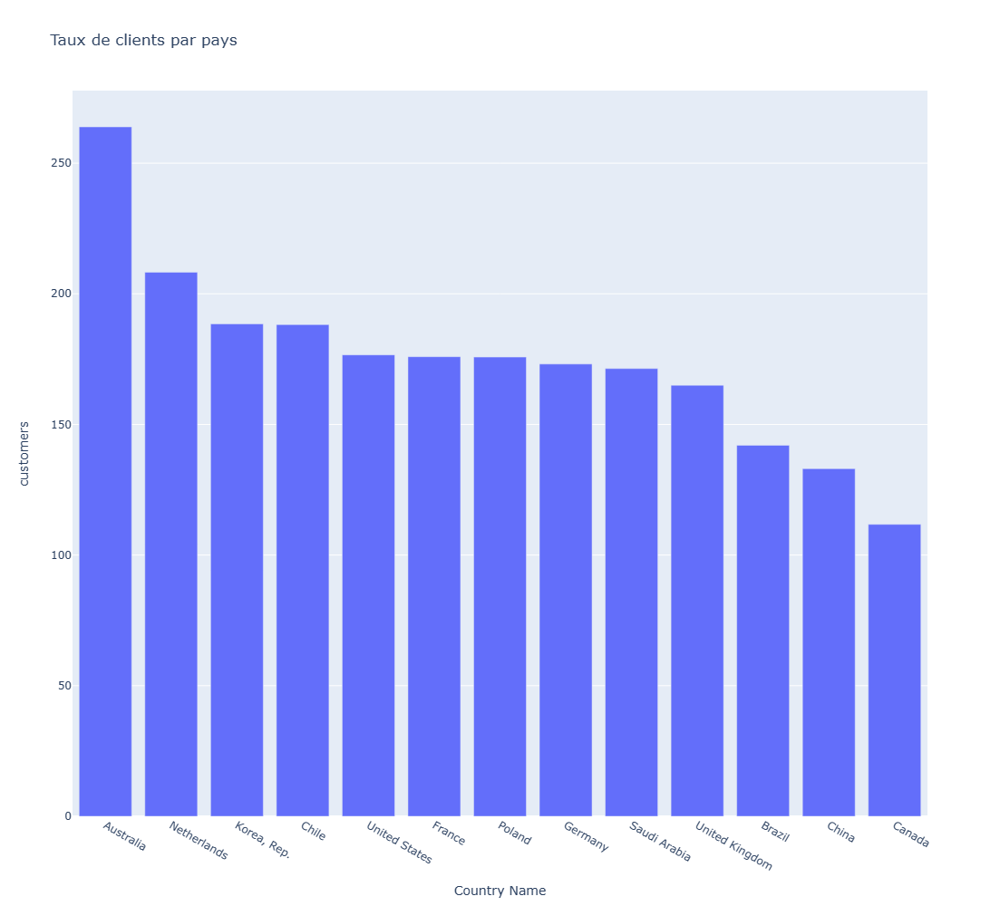

In [43]:
# représenter graphiquement la liste des pays sortant par la variable customers
fig1 = px.bar(filtered_df_sorted.sort_values(by='customers', ascending= False), x= 'Country Name', y = 'customers', width=1000,height = 1000, title = "Taux de clients par pays")
fig1.show()

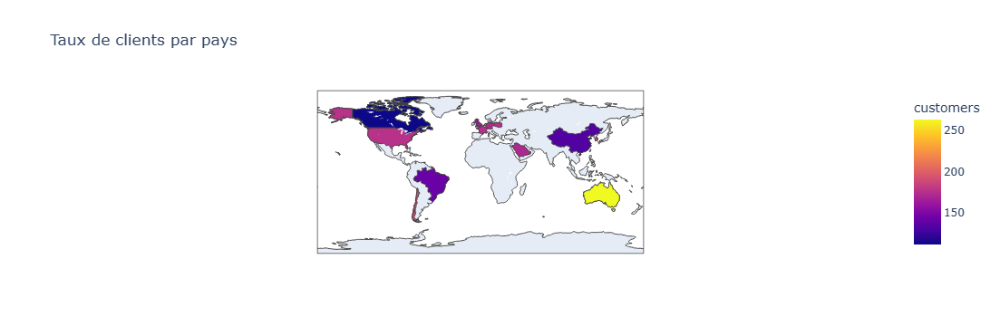

In [41]:
# Créer une carte choroplèthe en fonction des customers
fig1_C = px.choropleth(filtered_df_sorted, 
                     locations="Country Name", 
                     locationmode='country names',
                     color="customers", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title="Taux de clients par pays")

# Afficher la carte
fig1_C.show()


In [42]:
# Classer les pays par ordre décroissant de potential_customers
filtered_df_sorted2 = filtered_df.sort_values(by='potential_customers', ascending=False)

# Réinitialiser les index du tableau classé
filtered_df_sorted2.reset_index(drop=True, inplace=True)

# Afficher le tableau classé
filtered_df_sorted2

Indicator Code,Country Name,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,customers,potential_customers,potential_customers comp
0,Australia,84.560519,0.000000,178.556668,85.332562,5.212932,2914620.0,263.889230,2.231461,13.756366
1,Netherlands,91.724138,0.000000,134.458405,73.768501,5.534642,2005912.0,208.226906,1.909943,11.524613
2,"Korea, Rep.",89.648631,0.000000,95.281891,93.179138,5.052110,6456561.0,188.461029,1.689527,9.521259
3,United Kingdom,92.000300,0.000000,106.872313,58.124581,5.684270,7731522.0,164.996894,1.517976,9.378869
4,Germany,87.589800,0.000000,104.849243,68.265587,4.907592,8682394.0,173.114830,1.516309,8.495770
5,France,84.694500,0.000000,115.591806,60.335406,5.552842,7567872.0,175.927212,1.490007,9.768961
6,United States,74.554202,0.000000,90.821086,85.795776,5.230070,45147517.0,176.616862,1.316753,9.237186
7,Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0,188.196053,1.209894,9.265344
8,Poland,67.997000,0.000000,104.092271,71.695662,4.903020,4404280.0,175.787933,1.195305,8.618918
9,Saudi Arabia,69.616236,99.221770,108.314159,63.066219,0.000000,5298036.0,171.380379,1.193086,0.000000


In [43]:
filtered_df_sorted2.loc[ : ,['Country Name','potential_customers']]

Indicator Code,Country Name,potential_customers
0,Australia,2.231461
1,Netherlands,1.909943
2,"Korea, Rep.",1.689527
3,United Kingdom,1.517976
4,Germany,1.516309
5,France,1.490007
6,United States,1.316753
7,Chile,1.209894
8,Poland,1.195305
9,Saudi Arabia,1.193086


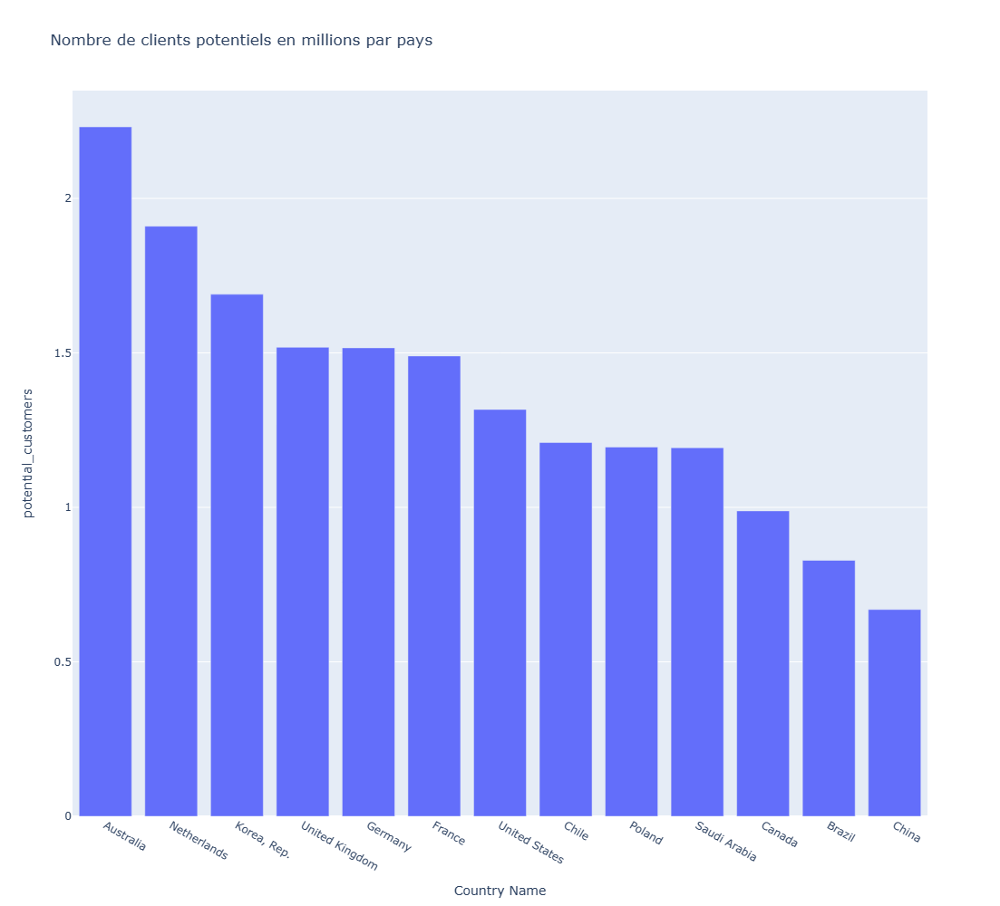

In [47]:
# représenter graphiquement la liste des pays sortant par la variable "Potential Customers".
fig2 = px.bar(filtered_df_sorted2.sort_values(by='potential_customers', ascending= False), x= 'Country Name', y = 'potential_customers', width=1000,height = 1000, title = "Nombre de clients potentiels en millions par pays")
fig2.show()

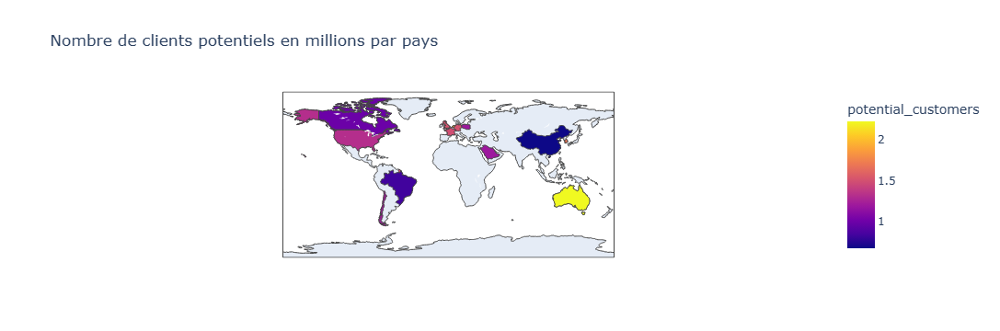

In [44]:
# Créer une carte choroplèthe en fonction des potential_customers
fig2_C = px.choropleth(filtered_df_sorted2, 
                     locations="Country Name", 
                     locationmode='country names',
                     color="potential_customers", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title="Nombre de clients potentiels en millions par pays")

# Afficher la carte
fig2_C.show()

** Conclusion*
***

Les 5 pays qui ressortent en premiers sont :
- Australie
- Pays-Bas
- Corée du Sud
- Angleterre
- Allemagne

La plupart sont en europe, ce qui est un avantage en regardant la proximité géograpique, il sera facile de s'implanter dans ces pays, donc il reste à étudier la langue d'enseignement dans chacune de ces pays, donc il faut prévoir une évetuelle traduction à la langue locale de chaque pays

Sinon en regardant la liste complète des 13 pays ressortis, on trouve qu'ils appartiennent  tous à des régions différentes, et cela est intéressant. En s'implantant dans ces pays, nous serons présents sur presque tous les continents à l'exception de l'Afrique.n

In [45]:
# Classer les pays par ordre décroissant de potential_customers comp (comparatif)
filtered_df_sorted3 = filtered_df.sort_values(by='potential_customers comp', ascending=False)

# Réinitialiser les index du tableau classé
filtered_df_sorted3.reset_index(drop=True, inplace=True)

# Afficher le tableau classé
filtered_df_sorted3

Indicator Code,Country Name,IT.NET.USER.P2,SE.ADT.1524.LT.ZS,SE.SEC.ENRR.UP,SE.TER.ENRR,SE.XPD.TOTL.GD.ZS,SP.POP.1524.TO.UN,customers,potential_customers,potential_customers comp
0,Australia,84.560519,0.000000,178.556668,85.332562,5.212932,2914620.0,263.889230,2.231461,13.756366
1,Netherlands,91.724138,0.000000,134.458405,73.768501,5.534642,2005912.0,208.226906,1.909943,11.524613
2,France,84.694500,0.000000,115.591806,60.335406,5.552842,7567872.0,175.927212,1.490007,9.768961
3,"Korea, Rep.",89.648631,0.000000,95.281891,93.179138,5.052110,6456561.0,188.461029,1.689527,9.521259
4,United Kingdom,92.000300,0.000000,106.872313,58.124581,5.684270,7731522.0,164.996894,1.517976,9.378869
5,Chile,64.289000,99.228235,99.618759,88.577293,4.923240,2817084.0,188.196053,1.209894,9.265344
6,United States,74.554202,0.000000,90.821086,85.795776,5.230070,45147517.0,176.616862,1.316753,9.237186
7,Poland,67.997000,0.000000,104.092271,71.695662,4.903020,4404280.0,175.787933,1.195305,8.618918
8,Germany,87.589800,0.000000,104.849243,68.265587,4.907592,8682394.0,173.114830,1.516309,8.495770
9,Brazil,58.327952,98.440614,91.420326,50.604919,5.794417,33595574.0,142.025246,0.828404,8.229536


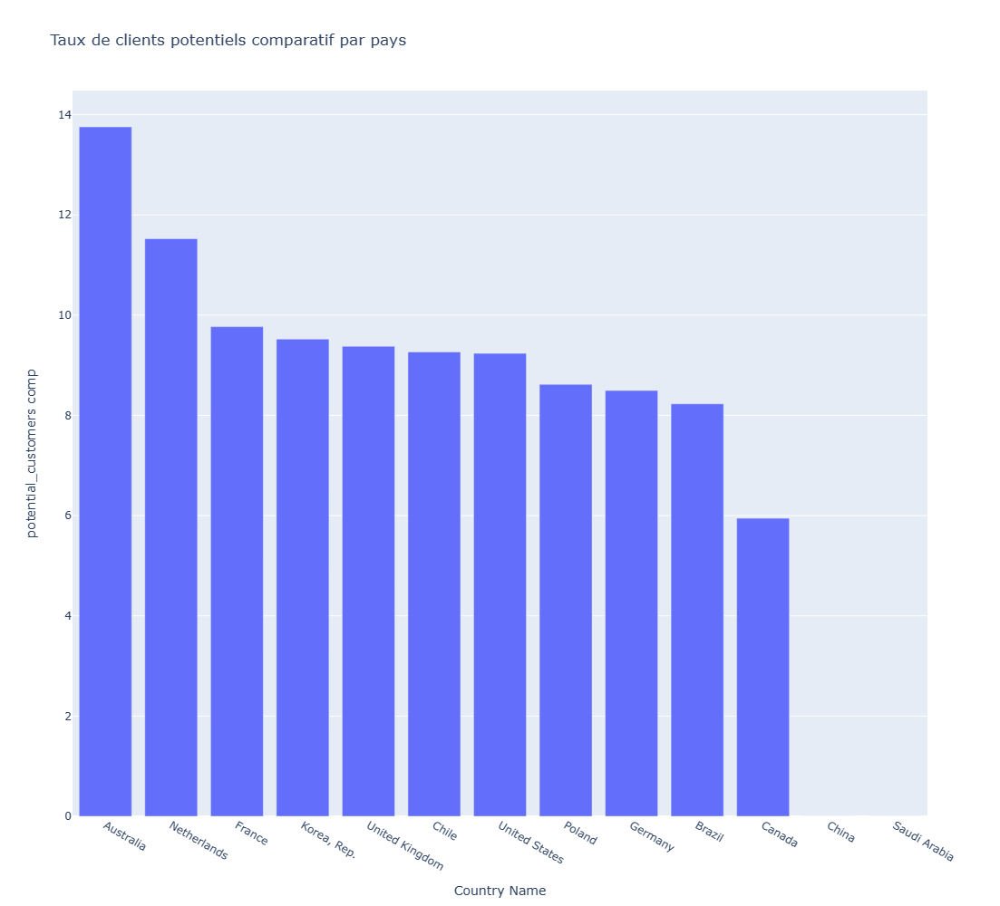

In [46]:
# représenter graphiquement la liste des pays sortant par la variable "Potential Customers Comp".
fig3 = px.bar(filtered_df_sorted3.sort_values(by='potential_customers comp', ascending= False), x= 'Country Name', y = 'potential_customers comp', width=1000,height = 1000, title = "Taux de clients potentiels comparatif par pays")
fig3.show()

### Regardez l’évolution par pays, en se basant sur plusieurs années (ainsi que celles à venir)

In [47]:
# filtrer nos données en fonctions des indicateurs codes suivants
Indicators_CodesE = ['SE.XPD.TOTL.GD.ZS', 'SE.SEC.ENRR.UP', 'SE.TER.ENRR', 'IT.NET.USER.P2', 'SP.POP.1524.TO.UN', 'SE.ADT.1524.LT.ZS']
filtE = data1['Indicator Code'].isin(Indicators_CodesE)

In [48]:
dataFE = data_country.loc[filtE,['Country Name', 'Country Code', 'Indicator Code', 'Indicator Name', '2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035']]

In [49]:
dataFE = data_country.loc[filtE,['Country Name', 'Country Code', 'Indicator Code', 'Indicator Name', '2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035']]

In [56]:
dataFE

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00,NaN,NaN,NaN
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",NaN,3.755980e+00,NaN,NaN,8.662800e+00,NaN,NaN,NaN,NaN
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01,NaN,NaN,NaN
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00,NaN,NaN,NaN
94107,Afghanistan,AFG,SP.POP.1524.TO.UN,"Population, ages 15-24, total",6.090239e+06,6.330684e+06,6.569239e+06,6.803785e+06,7.032072e+06,7.252785e+06,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
884604,Zimbabwe,ZWE,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",5.905600e+00,5.823760e+00,5.868670e+00,5.871750e+00,NaN,8.433270e+00,NaN,NaN,NaN
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",NaN,NaN,3.623769e+01,3.696362e+01,NaN,NaN,NaN,NaN,NaN
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01,NaN,NaN,NaN
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06,NaN,NaN,NaN


In [50]:
# # Gérer ou traiter les valeurs manquantes
# Remplacer les valeurs manquantes par la moyenne des autres valeurs

# Sélectionner uniquement les colonnes avec les années
annees = ['2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035']

# Calculer la moyenne des valeurs pour chaque ligne
dataFE['Mean'] = dataFE[annees].mean(axis=1)

# Remplacer les valeurs manquantes pour chaque année spécifiée par la moyenne respective
for annee in annees:
    dataFE[annee].fillna(dataFE['Mean'], inplace=True)

# Supprimez la colonne 'Mean' 
dataFE.drop(columns=['Mean'], inplace=True)

# Afficher notre DataFrame modifié
dataFE

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00,3.334565e+00,3.334565e+00,3.334565e+00
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",6.209390e+00,3.755980e+00,6.209390e+00,6.209390e+00,8.662800e+00,6.209390e+00,6.209390e+00,6.209390e+00,6.209390e+00
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01,4.155718e+01,4.155718e+01,4.155718e+01
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00,5.935758e+00,5.935758e+00,5.935758e+00
94107,Afghanistan,AFG,SP.POP.1524.TO.UN,"Population, ages 15-24, total",6.090239e+06,6.330684e+06,6.569239e+06,6.803785e+06,7.032072e+06,7.252785e+06,6.679801e+06,6.679801e+06,6.679801e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...
884604,Zimbabwe,ZWE,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",5.905600e+00,5.823760e+00,5.868670e+00,5.871750e+00,6.380610e+00,8.433270e+00,6.380610e+00,6.380610e+00,6.380610e+00
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.660065e+01,3.660065e+01,3.623769e+01,3.696362e+01,3.660065e+01,3.660065e+01,3.660065e+01,3.660065e+01,3.660065e+01
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01,1.356793e+01,1.356793e+01,1.356793e+01
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06,3.370104e+06,3.370104e+06,3.370104e+06


In [51]:
# Supprimer les lignes contenant que des valeurs manquantes
dataFE_cleaned = dataFE.dropna()
dataFE_cleaned

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
92885,Afghanistan,AFG,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,3.461490e+00,3.439140e+00,2.527540e+00,3.481400e+00,3.780280e+00,3.317540e+00,3.334565e+00,3.334565e+00,3.334565e+00
92964,Afghanistan,AFG,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",6.209390e+00,3.755980e+00,6.209390e+00,6.209390e+00,8.662800e+00,6.209390e+00,6.209390e+00,6.209390e+00,6.209390e+00
92968,Afghanistan,AFG,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.213401e+01,3.986274e+01,4.456518e+01,4.626244e+01,4.390559e+01,4.261313e+01,4.155718e+01,4.155718e+01,4.155718e+01
93000,Afghanistan,AFG,IT.NET.USER.P2,Internet users (per 100 people),4.000000e+00,5.000000e+00,5.454545e+00,5.900000e+00,7.000000e+00,8.260000e+00,5.935758e+00,5.935758e+00,5.935758e+00
94107,Afghanistan,AFG,SP.POP.1524.TO.UN,"Population, ages 15-24, total",6.090239e+06,6.330684e+06,6.569239e+06,6.803785e+06,7.032072e+06,7.252785e+06,6.679801e+06,6.679801e+06,6.679801e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...
884604,Zimbabwe,ZWE,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",5.905600e+00,5.823760e+00,5.868670e+00,5.871750e+00,6.380610e+00,8.433270e+00,6.380610e+00,6.380610e+00,6.380610e+00
884608,Zimbabwe,ZWE,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",3.660065e+01,3.660065e+01,3.623769e+01,3.696362e+01,3.660065e+01,3.660065e+01,3.660065e+01,3.660065e+01,3.660065e+01
884640,Zimbabwe,ZWE,IT.NET.USER.P2,Internet users (per 100 people),6.400000e+00,8.400000e+00,1.200000e+01,1.550000e+01,1.636474e+01,2.274282e+01,1.356793e+01,1.356793e+01,1.356793e+01
885747,Zimbabwe,ZWE,SP.POP.1524.TO.UN,"Population, ages 15-24, total",3.389035e+06,3.389423e+06,3.383141e+06,3.371070e+06,3.354236e+06,3.333716e+06,3.370104e+06,3.370104e+06,3.370104e+06


In [52]:
dataFE_melt = dataFE_cleaned.melt(id_vars=['Country Name', 'Indicator Code'], 
                                 var_name='Year', 
                                 value_vars=['2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035'], 
                                 value_name='Value')
dataFE_melt

,Country Name,Indicator Code,Year,Value
0,Afghanistan,SE.XPD.TOTL.GD.ZS,2010,3.461490e+00
1,Afghanistan,SE.TER.ENRR,2010,6.209390e+00
2,Afghanistan,SE.SEC.ENRR.UP,2010,3.213401e+01
3,Afghanistan,IT.NET.USER.P2,2010,4.000000e+00
4,Afghanistan,SP.POP.1524.TO.UN,2010,6.090239e+06
...,...,...,...,...
9040,Zimbabwe,SE.TER.ENRR,2035,6.380610e+00
9041,Zimbabwe,SE.SEC.ENRR.UP,2035,3.660065e+01
9042,Zimbabwe,IT.NET.USER.P2,2035,1.356793e+01
9043,Zimbabwe,SP.POP.1524.TO.UN,2035,3.370104e+06


In [53]:
countries_to_select = ['Australia', 'Netherlands', 'Korea, Rep.', 'Chile', 'United States', 'Germany', 'United Kingdom', 'Saudi Arabia', 'China', 'Canada', 'Poland', 'Brazil']
filtered_data = dataFE_melt[dataFE_melt['Country Name'].isin(countries_to_select)]
filtered_data

,Country Name,Indicator Code,Year,Value
46,Australia,SE.XPD.TOTL.GD.ZS,2010,5.555230e+00
47,Australia,SE.TER.ENRR,2010,8.091708e+01
48,Australia,SE.SEC.ENRR.UP,2010,1.685208e+02
49,Australia,IT.NET.USER.P2,2010,7.600000e+01
50,Australia,SP.POP.1524.TO.UN,2010,2.914315e+06
...,...,...,...,...
8996,United States,SE.XPD.TOTL.GD.ZS,2035,5.230070e+00
8997,United States,SE.TER.ENRR,2035,9.111017e+01
8998,United States,SE.SEC.ENRR.UP,2035,9.082109e+01
8999,United States,IT.NET.USER.P2,2035,7.251228e+01


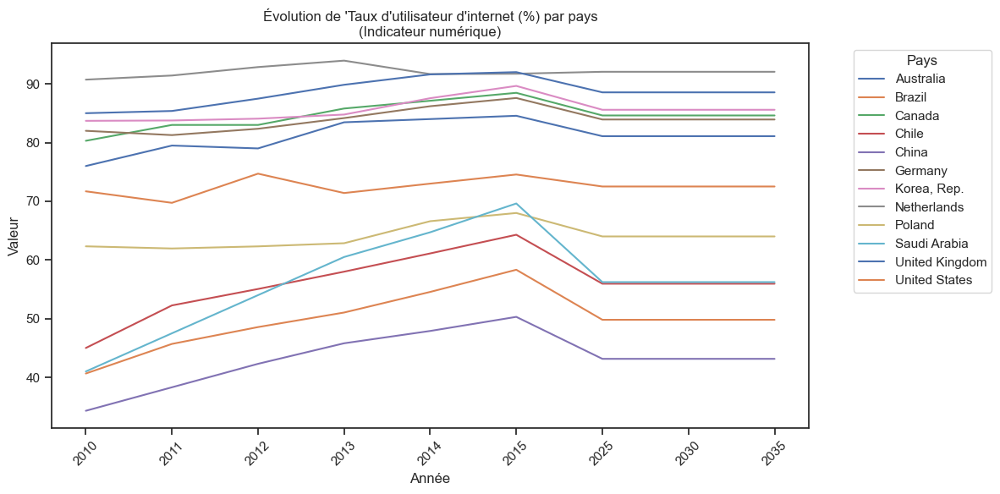

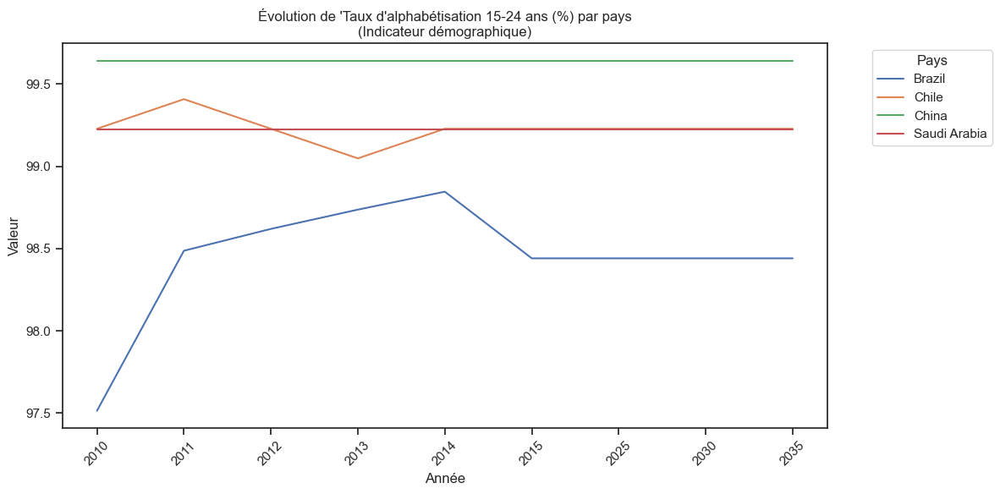

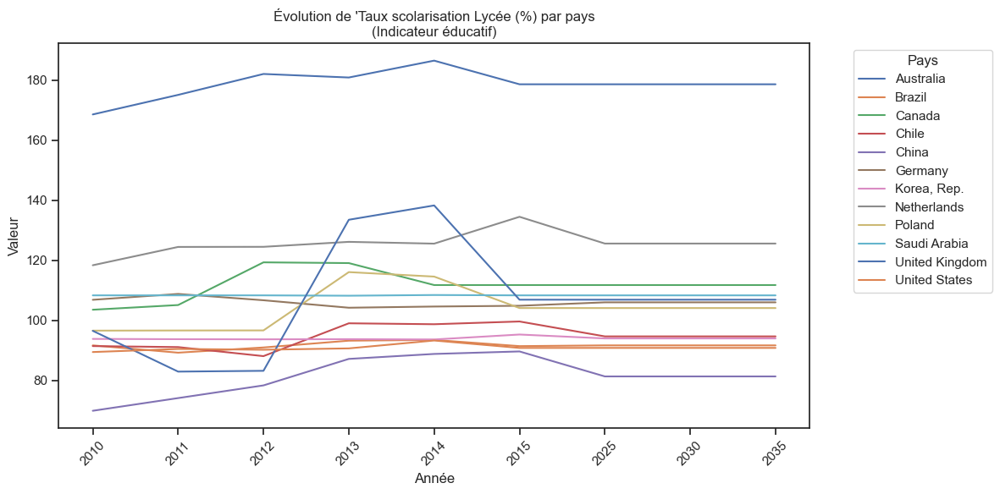

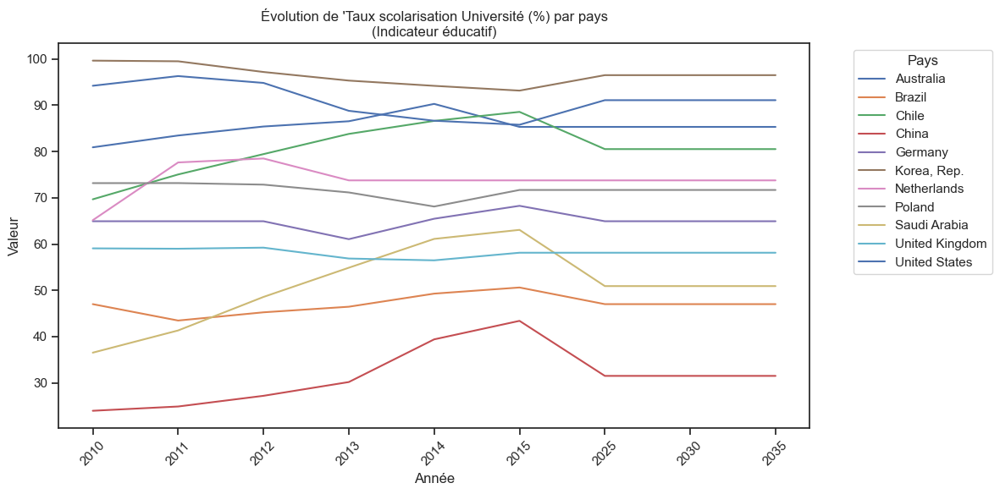

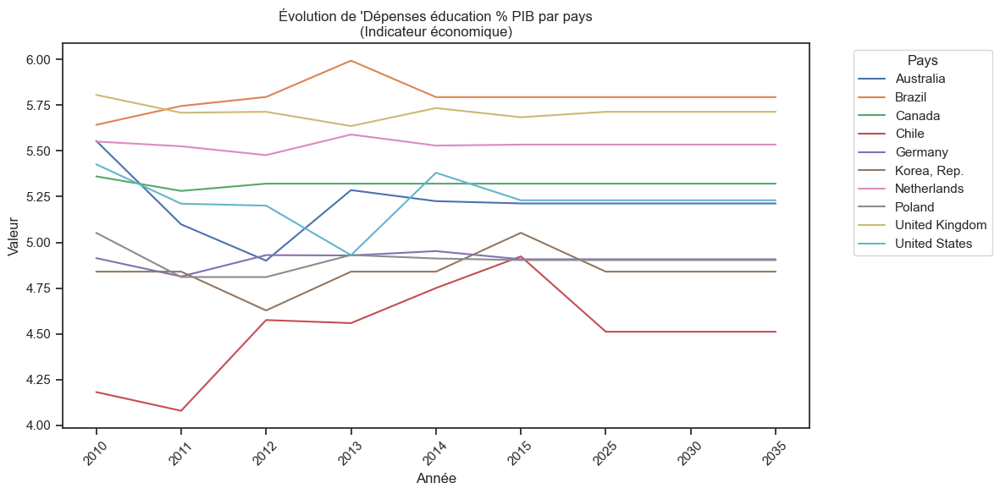

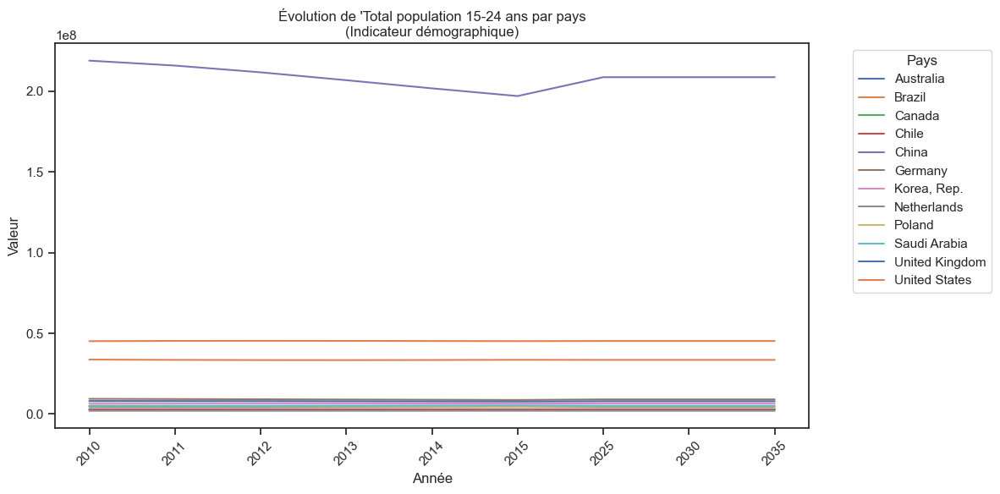

Les figures ont été enregistrées avec succès.


In [54]:
# Liste des indicateurs uniques dans votre DataFrame
indicators = filtered_data['Indicator Code'].unique()

# Liste des indicateurs avec leurs détails
indicateurs = [
    ('IT.NET.USER.P2', 'Taux d\'utilisateur d\'internet (%)', 'Indicateur numérique'),
    ('SE.ADT.1524.LT.ZS', 'Taux d\'alphabétisation 15-24 ans (%)', 'Indicateur démographique'),
    ('SE.SEC.ENRR.UP', 'Taux scolarisation Lycée (%)', 'Indicateur éducatif'),
    ('SE.TER.ENRR', 'Taux scolarisation Université (%)', 'Indicateur éducatif'),
    ('SE.XPD.TOTL.GD.ZS', 'Dépenses éducation % PIB', 'Indicateur économique'),
    ('SP.POP.1524.TO.UN', 'Total population 15-24 ans', 'Indicateur démographique')
]

# Créer un sous-graphique pour chaque indicateur
for indicator_code, indicator_title, indicator_type in indicateurs:
    # Filtrer les données pour l'indicateur actuel
    filtered_data_indicator = filtered_data[filtered_data['Indicator Code'] == indicator_code]
    
    # Créer un nouveau graphique
    plt.figure(figsize=(12, 6))
    
    # Tracer une ligne pour chaque pays
    for country, group in filtered_data_indicator.groupby('Country Name'):
        plt.plot(group['Year'], group['Value'], label=country)
    
    # Ajouter des titres, des légendes, etc.
    plt.xlabel('Année')
    plt.ylabel('Valeur')
    plt.title(f'Évolution de \'{indicator_title} par pays\n({indicator_type})')
    plt.legend(title='Pays', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Enregistrer le graphique dans un fichier
    plt.savefig(f'figure_{indicator_code}.png', dpi=300)  # Enregistrer en PNG avec une résolution de 300 dpi
    
    # Afficher le graphique dans le notebook
    plt.show()
    
    plt.close()  # Fermer le graphique pour libérer la mémoire

# Afficher un message une fois que tous les graphiques ont été enregistrés
print("Les figures ont été enregistrées avec succès.")

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\837855911.py:26: UserWarning:

The palette list has more values (12) than needed (10), which may not be intended.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\837855911.py:26: UserWarning:

The palette list has more values (12) than needed (11), which may not be intended.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\anaconda3\Lib

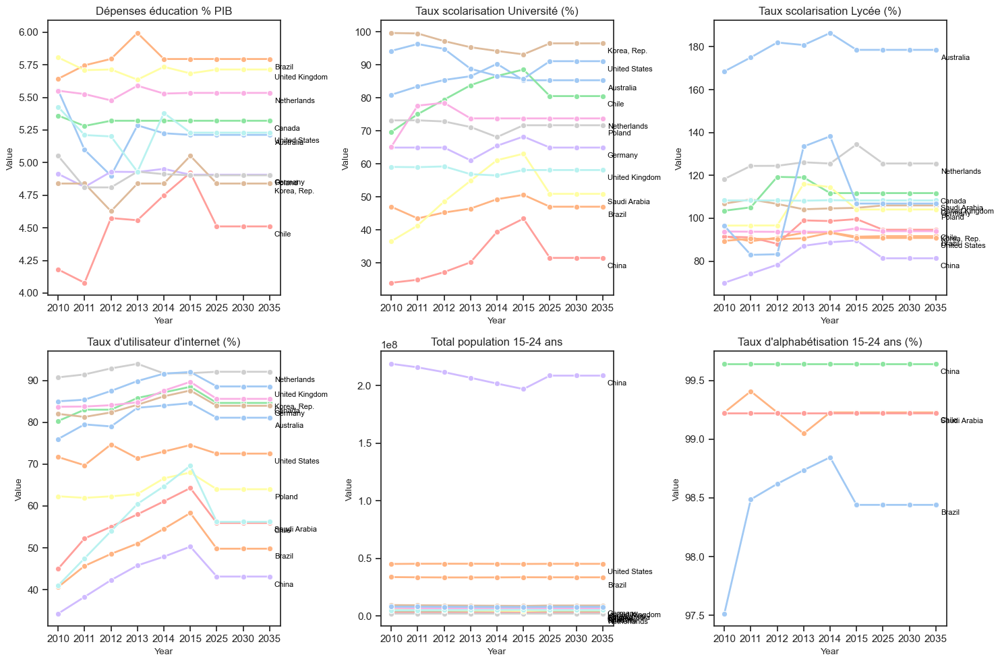

In [69]:
# Liste des indicateurs à tracer
indicators = ['SE.XPD.TOTL.GD.ZS', 'SE.TER.ENRR', 'SE.SEC.ENRR.UP', 'IT.NET.USER.P2', 'SP.POP.1524.TO.UN', 'SE.ADT.1524.LT.ZS']

# Liste des indicateurs avec leurs détails
indicateurs_details = {
    'IT.NET.USER.P2': 'Taux d\'utilisateur d\'internet (%)',
    'SE.ADT.1524.LT.ZS': 'Taux d\'alphabétisation 15-24 ans (%)',
    'SE.SEC.ENRR.UP': 'Taux scolarisation Lycée (%)',
    'SE.TER.ENRR': 'Taux scolarisation Université (%)',
    'SE.XPD.TOTL.GD.ZS': 'Dépenses éducation % PIB',
    'SP.POP.1524.TO.UN': 'Total population 15-24 ans'
}

# Obtenir tous les pays présents dans les données
all_countries = filtered_data['Country Name'].unique()

# Définir une palette de couleurs claires
palette = sns.color_palette("pastel", len(all_countries))

# Créer une figure pour les graphiques
plt.figure(figsize=(15, 10))  

# Tracer un graphique pour chaque indicateur
for i, indicator_code in enumerate(indicators, 1):
    ax = plt.subplot(2, 3, i)  # Créer un sous-graphique dans une grille 2x3
    sns.lineplot(data=filtered_data[filtered_data['Indicator Code'] == indicator_code], x="Year", y="Value", hue="Country Name", palette=palette, linewidth=2, marker="o")
    ax.set_title(indicateurs_details[indicator_code], fontsize=12)  # Ajouter le titre de l'indicateur
    ax.set_xlabel("Year", fontsize=10)  # Ajouter une étiquette x
    ax.set_ylabel("Value", fontsize=10)  # Ajouter une étiquette y
    ax.legend().remove()  # Supprimer la légende pour une meilleure lisibilité
    # Ajouter le nom de chaque pays sur la courbe avec un décalage
    for country in all_countries:
        country_data = filtered_data[(filtered_data['Indicator Code'] == indicator_code) & (filtered_data['Country Name'] == country)]
        if not country_data.empty:
            x = country_data['Year'].iloc[-1]
            y = country_data['Value'].iloc[-1]
            plt.annotate(country, xy=(x, y), xytext=(5, -5), textcoords='offset points', fontsize=8, color='black', ha='left', va='top')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Sauvegarder la figure
plt.savefig('évolution_indicateurs_par_pays.png') 

# Afficher les graphiques
plt.show()

** Conclusions *
***

En regardant ces graphiques, on remarque que  les valeurs sur les années futures sont fixes, on ne peut pas prédire l’évolution de nos 6 indicateurs pour chaque pays dans le future.

Par contre si on se base sur les années les plus récentes qu'on a de 2010 à 2015:
  - en terme de dépenses en éducation,  on remarque que le Chili et la Corée du Sud sont en évolution continue depuis 2011 pour le Chili et depuis 2012 pour la Corée du Sud.
  - concernant le taux de scolarisation à l'université, on remarque que les pays suivantes : le Chili, l'Arabie Saoudite, et la Chine sont en évolution forte et continue.
  - concernant le taux de scolarisation au lycée, on peut déduire que les pays suivantes : les Pays-Bas, le Chili, l'Angleterre et la chine sont relativement en évolution aussi.  
  - pour le taux d’utilisation d’internet, on remarque que tous les pays sont en progression, avec la Chine, les Etas-Unis, le Chili et l'Arabie Saoudite en très forte évolution entre 2010 et 2015. Mais malgré cette forte évolution la Chine a le plus faible pourcentage d’utilisateurs d’internet.
  - concernant le total de la population de 15 à 24 ans, on voit que cet indicateur a des valeurs fixes pour la plupart des pays, donc il n’est pas très informatif en terme d’évolution, mais on peut déduire que la chine a la population la plus élevé de jeunes de 15 à 24 ans.
  - pour le taux d’alphabétisation des jeunes de 15 à 24 ans, on a pas de données pour tous les pays, on a que la chine avec un taux fixe de plus de 99,5 %, l'Arabie Saoudite avec un taux fixe de plus de 99 %,  le chili avec un taux variable mais qui dépasse toujours les 99% et le Brazile avec un taux maximale en 2014 et qui dépasse les 98,5 %.





### Filtrer mes données et regarder l'évolution par régions 

In [56]:
# Définir la liste des régions et catégories
region = ['East Asia & Pacific',
       'Europe & Central Asia',
       'Latin America & Caribbean',
       'Middle East & North Africa',
          'North America', 'South Asia',
       'Sub-Saharan Africa']

In [57]:
# Filtrer les régions et catégories
dataF_region = dataF[dataF['Country Name'].isin(region)]

In [58]:
# Afficher la dataframe contenant que les régions et catégories
dataF_region 

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
4925,East Asia & Pacific,EAS,Government expenditure on education as % of GD...,SE.XPD.TOTL.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5004,East Asia & Pacific,EAS,"Gross enrolment ratio, tertiary, both sexes (%)",SE.TER.ENRR,3.154540,3.047160,3.155800,3.243450,3.513950,3.813300,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5008,East Asia & Pacific,EAS,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5040,East Asia & Pacific,EAS,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5749,East Asia & Pacific,EAS,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6147,East Asia & Pacific,EAS,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7326,East Asia & Pacific,EAS,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15920,Europe & Central Asia,ECS,Government expenditure on education as % of GD...,SE.XPD.TOTL.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15999,Europe & Central Asia,ECS,"Gross enrolment ratio, tertiary, both sexes (%)",SE.TER.ENRR,24.665920,24.626841,24.934799,25.362329,25.662979,26.244360,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16003,Europe & Central Asia,ECS,"Gross enrolment ratio, upper secondary, both s...",SE.SEC.ENRR.UP,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### Créer une nouvelle data frame dataF2 avec le filtre qu'on a utilisé pour les indicateurs "indicator name" et les années les plus récentes ('2010', '2011', '2012', '2013', '2014', '2015') avec moins de valeurs manquantes et les années futures ('2025', '2030', '2035') et qui donnent une idée sur l'évolution de chaque région du monde au fil des années


In [59]:
dataF2 = dataF_region .loc[filt,['Country Name', 'Country Code', 'Indicator Code', 'Indicator Name', '2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035']]

In [72]:
dataF2

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
4925,East Asia & Pacific,EAS,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5004,East Asia & Pacific,EAS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",27.779831,29.030970,31.092489,33.307961,39.147720,NaN,NaN,NaN,NaN
5008,East Asia & Pacific,EAS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",67.705742,71.167213,74.200012,79.657349,79.549347,NaN,NaN,NaN,NaN
5040,East Asia & Pacific,EAS,IT.NET.USER.P2,Internet users (per 100 people),34.230838,37.365156,40.709345,44.577349,46.812103,49.787924,NaN,NaN,NaN
5749,East Asia & Pacific,EAS,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6147,East Asia & Pacific,EAS,SP.POP.1524.TO.UN,"Population, ages 15-24, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7326,East Asia & Pacific,EAS,SE.ADT.1524.LT.ZS,"Youth literacy rate, population 15-24 years, b...",99.004402,99.004402,99.004402,99.004402,99.004402,NaN,NaN,NaN,NaN
15920,Europe & Central Asia,ECS,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15999,Europe & Central Asia,ECS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",61.452751,62.561241,63.392509,64.475471,65.080727,NaN,NaN,NaN,NaN
16003,Europe & Central Asia,ECS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",94.425270,95.528732,96.030617,107.284531,108.247787,NaN,NaN,NaN,NaN


In [54]:
dataF2.describe()  

,2010,2011,2012,2013,2014,2015,2025,2030,2035
count,27.000000,27.000000,27.000000,27.000000,27.000000,7.000000,0.0,0.0,0.0
mean,56.377832,57.895551,59.447238,60.765033,62.036420,48.049579,NaN,NaN,NaN
std,31.339716,30.699000,30.011257,29.859668,29.034472,22.001158,NaN,NaN,NaN
min,7.154990,8.051060,8.308930,8.533300,8.593480,17.755638,NaN,NaN,NaN
25%,31.316891,31.987559,33.702751,35.505209,39.643114,33.710360,NaN,NaN,NaN
50%,59.108269,62.561241,63.486253,66.020699,66.641861,49.787924,NaN,NaN,NaN
75%,87.141911,87.826313,87.431595,84.711025,83.753796,62.720868,NaN,NaN,NaN
max,99.711449,99.711449,99.711449,107.284531,108.247787,75.941036,NaN,NaN,NaN


In [55]:
# Vérifier les valeurs manquantes sur ma nouvelle dataframe
dataF2.isnull().sum()

Country Name       0
Country Code       0
Indicator Code     0
Indicator Name     0
2010              22
2011              22
2012              22
2013              22
2014              22
2015              42
2025              49
2030              49
2035              49
dtype: int64

In [60]:
# # Gérer ou traiter les valeurs manquantes
# Remplacer les valeurs manquantes par la moyenne des autres valeurs

# Sélectionner uniquement les colonnes avec les années
annees = ['2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035']

# Calculer la moyenne des valeurs pour chaque ligne
dataF2['Mean'] = dataF2[annees].mean(axis=1)

# Remplacer les valeurs manquantes pour chaque année spécifiée par la moyenne respective
for annee in annees:
    dataF2[annee].fillna(dataF2['Mean'], inplace=True)

# Supprimez la colonne 'Mean' 
dataF2.drop(columns=['Mean'], inplace=True)

# Afficher les premières lignes du DataFrame modifié
dataF2.head()

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
4925,East Asia & Pacific,EAS,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5004,East Asia & Pacific,EAS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",27.779831,29.030970,31.092489,33.307961,39.147720,32.071794,32.071794,32.071794,32.071794
5008,East Asia & Pacific,EAS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",67.705742,71.167213,74.200012,79.657349,79.549347,74.455933,74.455933,74.455933,74.455933
5040,East Asia & Pacific,EAS,IT.NET.USER.P2,Internet users (per 100 people),34.230838,37.365156,40.709345,44.577349,46.812103,49.787924,42.247119,42.247119,42.247119
5749,East Asia & Pacific,EAS,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
dataF2

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
4925,East Asia & Pacific,EAS,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5004,East Asia & Pacific,EAS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",27.779831,29.030970,31.092489,33.307961,39.147720,32.071794,32.071794,32.071794,32.071794
5008,East Asia & Pacific,EAS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",67.705742,71.167213,74.200012,79.657349,79.549347,74.455933,74.455933,74.455933,74.455933
5040,East Asia & Pacific,EAS,IT.NET.USER.P2,Internet users (per 100 people),34.230838,37.365156,40.709345,44.577349,46.812103,49.787924,42.247119,42.247119,42.247119
5749,East Asia & Pacific,EAS,IT.CMP.PCMP.P2,Personal computers (per 100 people),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6147,East Asia & Pacific,EAS,SP.POP.1524.TO.UN,"Population, ages 15-24, total",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7326,East Asia & Pacific,EAS,SE.ADT.1524.LT.ZS,"Youth literacy rate, population 15-24 years, b...",99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402
15920,Europe & Central Asia,ECS,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15999,Europe & Central Asia,ECS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",61.452751,62.561241,63.392509,64.475471,65.080727,63.392540,63.392540,63.392540,63.392540
16003,Europe & Central Asia,ECS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",94.425270,95.528732,96.030617,107.284531,108.247787,100.303387,100.303387,100.303387,100.303387


In [61]:
# Supprimer les lignes contenant des valeurs manquantes
dataF2_cleaned = dataF2.dropna()

In [62]:
dataF2_cleaned 

,Country Name,Country Code,Indicator Code,Indicator Name,2010,2011,2012,2013,2014,2015,2025,2030,2035
5004,East Asia & Pacific,EAS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",27.779831,29.030970,31.092489,33.307961,39.147720,32.071794,32.071794,32.071794,32.071794
5008,East Asia & Pacific,EAS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",67.705742,71.167213,74.200012,79.657349,79.549347,74.455933,74.455933,74.455933,74.455933
5040,East Asia & Pacific,EAS,IT.NET.USER.P2,Internet users (per 100 people),34.230838,37.365156,40.709345,44.577349,46.812103,49.787924,42.247119,42.247119,42.247119
7326,East Asia & Pacific,EAS,SE.ADT.1524.LT.ZS,"Youth literacy rate, population 15-24 years, b...",99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402,99.004402
15999,Europe & Central Asia,ECS,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",61.452751,62.561241,63.392509,64.475471,65.080727,63.392540,63.392540,63.392540,63.392540
16003,Europe & Central Asia,ECS,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",94.425270,95.528732,96.030617,107.284531,108.247787,100.303387,100.303387,100.303387,100.303387
16035,Europe & Central Asia,ECS,IT.NET.USER.P2,Internet users (per 100 people),56.119117,58.834630,63.486253,66.306669,68.944351,71.162003,64.142171,64.142171,64.142171
18321,Europe & Central Asia,ECS,SE.ADT.1524.LT.ZS,"Youth literacy rate, population 15-24 years, b...",99.711449,99.711449,99.711449,99.711449,99.711449,99.711449,99.711449,99.711449,99.711449
34324,Latin America & Caribbean,LCN,SE.TER.ENRR,"Gross enrolment ratio, tertiary, both sexes (%)",40.511169,42.774330,43.749748,44.508259,44.664070,43.241515,43.241515,43.241515,43.241515
34328,Latin America & Caribbean,LCN,SE.SEC.ENRR.UP,"Gross enrolment ratio, upper secondary, both s...",75.409828,75.620216,76.520737,79.005760,80.043221,77.319952,77.319952,77.319952,77.319952


##### Après filtration des régions, on peut déduire qu'il n'y a pas de données fournis pour les 2 indicateurs "SE.XPD.TOTL.GD.ZS" "et SP.POP.1524.TO.UN", donc il nous reste 4 indicateurs à analyser.

In [63]:
# préparer nos données pour analyser l'évolution de chaque indicateur par région
# Faire fondre les données concernant les années et leurs valeurs en utilisant la fonction .melt()
dataF2_cleaned_melt = dataF2_cleaned.melt(id_vars=['Country Name', 'Indicator Code'], 
                                 var_name='Year', 
                                 value_vars=['2010', '2011', '2012', '2013', '2014', '2015', '2025', '2030', '2035'], 
                                 value_name='Value')
# Afficher la nouvelle dataframe
dataF2_cleaned_melt

,Country Name,Indicator Code,Year,Value
0,East Asia & Pacific,SE.TER.ENRR,2010,27.779831
1,East Asia & Pacific,SE.SEC.ENRR.UP,2010,67.705742
2,East Asia & Pacific,IT.NET.USER.P2,2010,34.230838
3,East Asia & Pacific,SE.ADT.1524.LT.ZS,2010,99.004402
4,Europe & Central Asia,SE.TER.ENRR,2010,61.452751
...,...,...,...,...
238,South Asia,SE.ADT.1524.LT.ZS,2035,83.475273
239,Sub-Saharan Africa,SE.TER.ENRR,2035,8.269322
240,Sub-Saharan Africa,SE.SEC.ENRR.UP,2035,33.357706
241,Sub-Saharan Africa,IT.NET.USER.P2,2035,11.825608


C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\AppData\Local\Temp\ipykernel_15776\2778321256.py:26: UserWarning:

The palette list has more values (7) than needed (6), which may not be intended.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\SOUKA\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before 

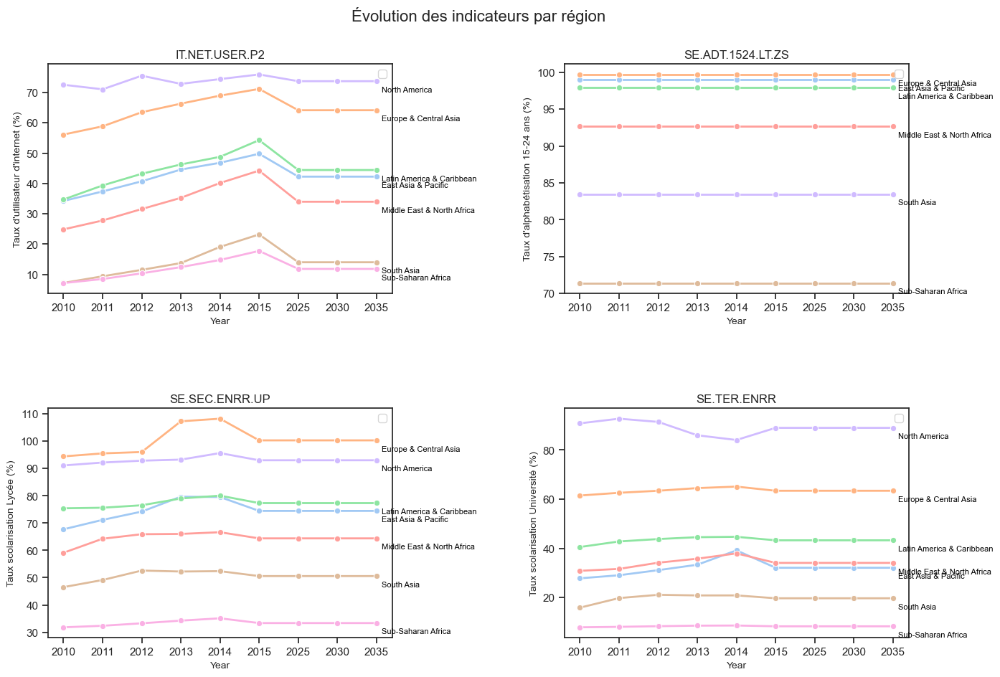

In [64]:
# Représenter graphiquement l'évolution de chaque indicateur par régions en fonction des années 

# Liste des indicateurs à tracer
indicators = ['SE.TER.ENRR', 'SE.SEC.ENRR.UP', 'IT.NET.USER.P2', 'SE.ADT.1524.LT.ZS']

# Liste des indicateurs avec leurs détails
indicateurs = [
  ('IT.NET.USER.P2', 'Taux d\'utilisateur d\'internet (%)', 'Indicateur numérique'),
    ('SE.ADT.1524.LT.ZS', 'Taux d\'alphabétisation 15-24 ans (%)', 'Indicateur démographique'),
    ('SE.SEC.ENRR.UP', 'Taux scolarisation Lycée (%)', 'Indicateur éducatif'),
    ('SE.TER.ENRR', 'Taux scolarisation Université (%)', 'Indicateur éducatif')
 
]

# Obtenir tous les pays présents dans les données
all_countries = dataF2_cleaned_melt['Country Name'].unique()

# Définir une palette de couleurs claires
palette = sns.color_palette("pastel", len(all_countries))
# Créer une figure pour les graphiques
plt.figure(figsize=(15, 10))                                         

# Tracer un graphique pour chaque indicateur
for i, (indicator_code, indicator_title, indicator_type) in enumerate(indicateurs, 1):
    plt.subplot(2, 2, i)  # Créer un sous-graphique dans une grille 2x2
    sns.lineplot(data=dataF2_cleaned_melt[dataF2_cleaned_melt['Indicator Code'] == indicator_code], x="Year", y="Value", hue="Country Name", palette=palette, linewidth=2, marker="o")
    plt.title(indicator_code, fontsize=12)  # Utiliser le code de l'indicateur comme titre
    plt.xlabel("Year", fontsize=10)  # Ajouter une étiquette x
    plt.ylabel(indicator_title, fontsize=10)  # Utiliser la description de l'indicateur comme étiquette y
    plt.legend([])  # Supprimer la légende pour une meilleure lisibilité
    # Ajouter le nom de chaque pays sur la courbe avec un décalage
    for country in all_countries:
        country_data = dataF2_cleaned_melt[(dataF2_cleaned_melt['Indicator Code'] == indicator_code) & (dataF2_cleaned_melt['Country Name'] == country)]
        if not country_data.empty:
            x = country_data['Year'].iloc[-1]
            y = country_data['Value'].iloc[-1]
            plt.annotate(country, xy=(x, y), xytext=(5, -5), textcoords='offset points', fontsize=8, color='black', ha='left', va='top')

# Ajuster l'espacement entre les sous-graphiques
plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, hspace=0.5, wspace=0.5)

# Ajouter un titre principal
plt.suptitle('Évolution des indicateurs par région', fontsize=16)

# Enregistrer la figure
plt.savefig('évolution_regions.png')

# Afficher les graphiques
plt.show()

** Conclusion *
***

Concernant l'évolution des 4 indicateurs fournis, le taux d'utilisation d'internet, les taux de scolarisation au lycée et à l'université et le taux d'alphabétisation des jeunes de 15 à 24 ans, par nos 7 régions, on peut déduire que les 4 premières régions les plus évoluées sont :

- l'Amérique du Nord (Etats-Unis, Canada), l'Europe et l'Asie Centrale ( Pays-Bas, Angleterre, Allemagne, Poland), Amérique latine et Caraïbes (Chili, Brazile) et Asie de l'Est et Pacifique (Australie et Corée du Sud, Chine)

- Ce qui correspond aux "tops pays" sortis de notre analyse : Australie, Pays-Bas,  la Corée du Sud, l'Angleterre, l'Allemagne, les Etats-Unis, le Chili, la Poland, l'Arabie-Saoudite, le Canada, le Brazile, et la Chine.a
